# DATA VISUALIZATION

In [142]:
import pandas as pd
df = pd.read_csv('aus.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [143]:
# Check data types of each column
data_types = df.dtypes

data_types


# -----------------------------------------------------------

# Check for duplicate rows
duplicate_rows = df[df.duplicated()]

num_duplicates = len(duplicate_rows)

num_duplicates

0

In [144]:
# Basic statistics for numerical columns to check for outliers
numerical_stats = df.describe()
numerical_stats

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [ ]:
# Check for missing values and calculate the percentage of missing values for each column
missing_data = df.isnull().sum()
missing_percentage = (df.isnull().sum() / len(df)) * 100

missing_df = pd.DataFrame({
    "Missing Values": missing_data,
    "Percentage": missing_percentage
})

missing_df.sort_values(by="Percentage", ascending=False)


In [145]:
# Identify numeric columns
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Calculate IQR and outlier bounds for each numeric column
outlier_bounds = {}

for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_bounds[col] = (lower_bound, upper_bound)

outlier_bounds

{'MinTemp': (-6.35, 30.849999999999998),
 'MaxTemp': (2.4499999999999975, 43.65),
 'Rainfall': (-1.2000000000000002, 2.0),
 'Evaporation': (-4.600000000000001, 14.600000000000001),
 'Sunshine': (-3.8999999999999995, 19.299999999999997),
 'WindGustSpeed': (5.5, 73.5),
 'WindSpeed9am': (-11.0, 37.0),
 'WindSpeed3pm': (-3.5, 40.5),
 'Humidity9am': (18.0, 122.0),
 'Humidity3pm': (-6.5, 109.5),
 'Pressure9am': (998.65, 1036.65),
 'Pressure3pm': (996.0, 1034.4),
 'Cloud9am': (-8.0, 16.0),
 'Cloud3pm': (-5.5, 14.5),
 'Temp9am': (-1.6500000000000004, 35.550000000000004),
 'Temp3pm': (1.9000000000000057, 41.099999999999994)}

In [146]:
# Check unique values in categorical columns for consistency
categorical_columns = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

unique_values = {column: df[column].unique() for column in categorical_columns}

unique_values

{'Location': array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
        'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
        'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
        'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
        'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
        'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
        'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
        'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
        'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
        'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object),
 'WindGustDir': array(['W', 'WNW', 'WSW', 'NE', 'NNW', 'N', 'NNE', 'SW', nan, 'ENE',
        'SSE', 'S', 'NW', 'SE', 'ESE', 'E', 'SSW'], dtype=object),
 'WindDir9am': array(['W', 'NNW', 'SE', 'ENE', 'SW', 'SSE', 'S', 'NE', nan, 'SSW', 'N',
        'WSW', 'ESE', 'E', 'NW',

In [147]:
# Identify categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns

# Create a dictionary to store the unique values and their counts for each categorical column
categorical_values = {}

for col in categorical_cols:
    categorical_values[col] = df[col].value_counts()

categorical_values

{'Date': Date
 2013-11-12    49
 2014-09-01    49
 2014-08-23    49
 2014-08-24    49
 2014-08-25    49
               ..
 2007-11-29     1
 2007-11-28     1
 2007-11-27     1
 2007-11-26     1
 2008-01-31     1
 Name: count, Length: 3436, dtype: int64,
 'Location': Location
 Canberra            3436
 Sydney              3344
 Darwin              3193
 Melbourne           3193
 Brisbane            3193
 Adelaide            3193
 Perth               3193
 Hobart              3193
 Albany              3040
 MountGambier        3040
 Ballarat            3040
 Townsville          3040
 GoldCoast           3040
 Cairns              3040
 Launceston          3040
 AliceSprings        3040
 Bendigo             3040
 Albury              3040
 MountGinini         3040
 Wollongong          3040
 Newcastle           3039
 Tuggeranong         3039
 Penrith             3039
 Woomera             3009
 Nuriootpa           3009
 Cobar               3009
 CoffsHarbour        3009
 Moree               3

In [148]:
# Convert categorical columns to uppdercase and trim white spaces
for col in categorical_cols:
    df[col] = df[col].str.upper().str.strip()

# Display the unique values and their counts for each categorical column after cleanup
cleaned_categorical_values = {}

for col in categorical_cols:
    cleaned_categorical_values[col] = df[col].value_counts()

cleaned_categorical_values

{'Date': Date
 2013-11-12    49
 2014-09-01    49
 2014-08-23    49
 2014-08-24    49
 2014-08-25    49
               ..
 2007-11-29     1
 2007-11-28     1
 2007-11-27     1
 2007-11-26     1
 2008-01-31     1
 Name: count, Length: 3436, dtype: int64,
 'Location': Location
 CANBERRA            3436
 SYDNEY              3344
 DARWIN              3193
 MELBOURNE           3193
 BRISBANE            3193
 ADELAIDE            3193
 PERTH               3193
 HOBART              3193
 ALBANY              3040
 MOUNTGAMBIER        3040
 BALLARAT            3040
 TOWNSVILLE          3040
 GOLDCOAST           3040
 CAIRNS              3040
 LAUNCESTON          3040
 ALICESPRINGS        3040
 BENDIGO             3040
 ALBURY              3040
 MOUNTGININI         3040
 WOLLONGONG          3040
 NEWCASTLE           3039
 TUGGERANONG         3039
 PENRITH             3039
 WOOMERA             3009
 NURIOOTPA           3009
 COBAR               3009
 COFFSHARBOUR        3009
 MOREE               3

In [149]:
# Validity Check for Date column

# Convert the 'Date' column to datetime format and check for any errors
try:
    df['Date'] = pd.to_datetime(df['Date'])
    date_min = df['Date'].min()
    date_max = df['Date'].max()
    date_validity = True
except Exception as e:
    date_validity = False
    error_message = str(e)

date_validity, date_min, date_max

(True, Timestamp('2007-11-01 00:00:00'), Timestamp('2017-06-25 00:00:00'))

In [150]:
# Define expected categories for each categorical column
expected_categories = {
    'WindGustDir': ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW'],
    'WindDir9am': ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW'],
    'WindDir3pm': ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW'],
    'RainToday': ['No', 'Yes'],
    'RainTomorrow': ['No', 'Yes']
}

# Check if the values in the categorical columns match the expected categories
valid_categories = {column: set(unique_values[column]).issubset(expected_categories[column]) 
                    for column in expected_categories}

valid_categories


{'WindGustDir': False,
 'WindDir9am': False,
 'WindDir3pm': False,
 'RainToday': False,
 'RainTomorrow': False}

In [151]:
# Identify unexpected values in the categorical columns
unexpected_values = {column: set(unique_values[column]) - set(expected_categories[column]) 
                     for column in expected_categories}

unexpected_values

{'WindGustDir': {nan},
 'WindDir9am': {nan},
 'WindDir3pm': {nan},
 'RainToday': {nan},
 'RainTomorrow': {nan}}

In [152]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [153]:
# Define expected data types for each column
expected_data_types = {
    'Date': 'datetime64[ns]',
    'Location': 'object',
    'MinTemp': 'float64',
    'MaxTemp': 'float64',
    'Rainfall': 'float64',
    'Evaporation': 'float64',
    'Sunshine': 'float64',
    'WindGustDir': 'object',
    'WindGustSpeed': 'float64',
    'WindDir9am': 'object',
    'WindDir3pm': 'object',
    'WindSpeed9am': 'float64',
    'WindSpeed3pm': 'float64',
    'Humidity9am': 'float64',
    'Humidity3pm': 'float64',
    'Pressure9am': 'float64',
    'Pressure3pm': 'float64',
    'Cloud9am': 'float64',
    'Cloud3pm': 'float64',
    'Temp9am': 'float64',
    'Temp3pm': 'float64',
    'RainToday': 'object',
    'RainTomorrow': 'object'
}

# Validate data types against expected data types
data_type_check = {column: expected_data_types[column] == str(df[column].dtype) 
                   for column in expected_data_types}

data_type_check


{'Date': True,
 'Location': True,
 'MinTemp': True,
 'MaxTemp': True,
 'Rainfall': True,
 'Evaporation': True,
 'Sunshine': True,
 'WindGustDir': True,
 'WindGustSpeed': True,
 'WindDir9am': True,
 'WindDir3pm': True,
 'WindSpeed9am': True,
 'WindSpeed3pm': True,
 'Humidity9am': True,
 'Humidity3pm': True,
 'Pressure9am': True,
 'Pressure3pm': True,
 'Cloud9am': True,
 'Cloud3pm': True,
 'Temp9am': True,
 'Temp3pm': True,
 'RainToday': True,
 'RainTomorrow': True}

In [154]:
# Check for leading/trailing whitespaces in string columns
string_columns = df.select_dtypes(include=['object']).columns

whitespace_check = {column: df[column].str.contains(r'^\s|\s$', na=False).any() 
                    for column in string_columns}

whitespace_check


{'Location': False,
 'WindGustDir': False,
 'WindDir9am': False,
 'WindDir3pm': False,
 'RainToday': False,
 'RainTomorrow': False}

In [155]:
# Cross-field validations

# 1. Temperature Consistency
temp_inconsistencies = df[df['MinTemp'] > df['MaxTemp']]

# 2. Pressure Consistency
pressure_inconsistencies_9am = df[(df['Pressure9am'] < 800) | (df['Pressure9am'] > 1100)]
pressure_inconsistencies_3pm = df[(df['Pressure3pm'] < 800) | (df['Pressure3pm'] > 1100)]

# 3. Rainfall and RainToday Consistency
rainfall_inconsistencies = df[((df['Rainfall'] > 1) & (df['RainToday'] != 'YES')) | 
                                ((df['Rainfall'] <= 1) & (df['RainToday'] != 'NO'))]

cross_field_results = {
    "Temperature Inconsistencies": len(temp_inconsistencies),
    "Pressure Inconsistencies (9am)": len(pressure_inconsistencies_9am),
    "Pressure Inconsistencies (3pm)": len(pressure_inconsistencies_3pm),
    "Rainfall and RainToday Inconsistencies": len(rainfall_inconsistencies)
}

cross_field_results


{'Temperature Inconsistencies': 0,
 'Pressure Inconsistencies (9am)': 0,
 'Pressure Inconsistencies (3pm)': 0,
 'Rainfall and RainToday Inconsistencies': 0}

In [156]:
# Filter rows with inconsistencies between 'Rainfall' and 'RainToday'
rainfall_inconsistency_df = df[((df['Rainfall'] > 0.5) & (df['RainToday'] != 'Yes')) | 
                                ((df['Rainfall'] <= 0.5) & (df['RainToday'] != 'No'))]

rainfall_inconsistency_df.head()  # Displaying the first few rows of the inconsistent data for review

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,ALBURY,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,NO,NO
1,2008-12-02,ALBURY,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,NO,NO
2,2008-12-03,ALBURY,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,NO,NO
3,2008-12-04,ALBURY,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,NO,NO
4,2008-12-05,ALBURY,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,NO,NO


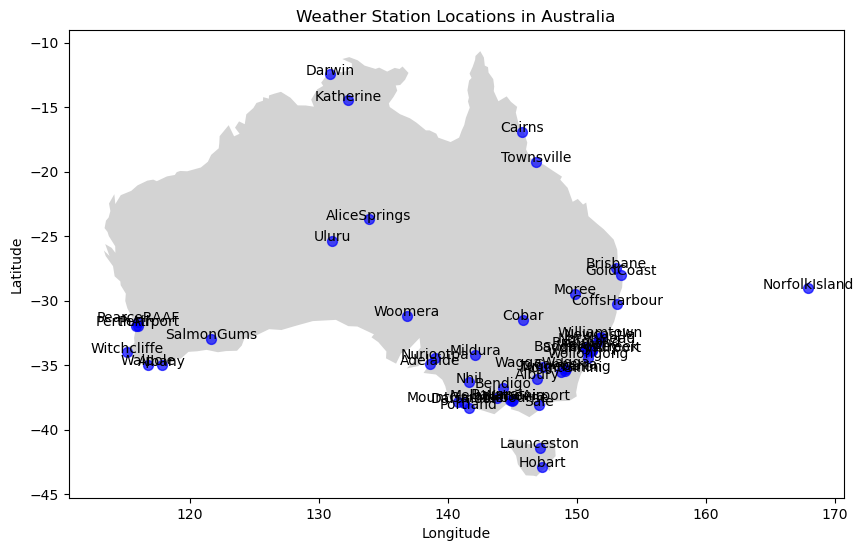

In [157]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the world map shapefile provided by geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter the world map to include only Australia
australia = world[world.name == 'Australia']

# Define the location coordinates
location_coordinates = {
    'Albury': (-36.0737, 146.9135),
    'BadgerysCreek': (-33.8799, 150.7525),
    'Cobar': (-31.4980, 145.8340),
    'CoffsHarbour': (-30.2960, 153.1150),
    'Moree': (-29.4644, 149.8415),
    'Newcastle': (-32.9169, 151.7500),
    'NorahHead': (-33.2831, 151.5675),
    'NorfolkIsland': (-29.0408, 167.9547),
    'Penrith': (-33.7526, 150.6941),
    'Richmond': (-33.6000, 150.7500),
    'Sydney': (-33.8688, 151.2093),
    'SydneyAirport': (-33.9461, 151.1772),
    'WaggaWagga': (-35.1150, 147.3677),
    'Williamtown': (-32.8150, 151.8433),
    'Wollongong': (-34.4278, 150.8931),
    'Canberra': (-35.2820, 149.1287),
    'Tuggeranong': (-35.4232, 149.0860),
    'MountGinini': (-35.5294, 148.7727),
    'Ballarat': (-37.5622, 143.8503),
    'Bendigo': (-36.7589, 144.2836),
    'Sale': (-38.1119, 147.0634),
    'MelbourneAirport': (-37.6705, 144.8322),
    'Melbourne': (-37.8136, 144.9631),
    'Mildura': (-34.2083, 142.1244),
    'Nhil': (-36.3328, 141.6502),
    'Portland': (-38.3510, 141.6056),
    'Watsonia': (-37.7117, 145.0835),
    'Dartmoor': (-37.9225, 141.2765),
    'Brisbane': (-27.4698, 153.0251),
    'Cairns': (-16.9186, 145.7781),
    'GoldCoast': (-28.0167, 153.4000),
    'Townsville': (-19.2580, 146.8169),
    'Adelaide': (-34.9285, 138.6007),
    'MountGambier': (-37.8284, 140.7815),
    'Nuriootpa': (-34.4694, 139.0057),
    'Woomera': (-31.1995, 136.8254),
    'Albany': (-35.0031, 117.8656),
    'Witchcliffe': (-34.0170, 115.1001),
    'PearceRAAF': (-31.6675, 116.0159),
    'PerthAirport': (-31.9405, 115.9660),
    'Perth': (-31.9505, 115.8605),
    'SalmonGums': (-32.9817, 121.6437),
    'Walpole': (-34.9773, 116.7311),
    'Hobart': (-42.8821, 147.3272),
    'Launceston': (-41.4298, 147.1401),
    'AliceSprings': (-23.7002, 133.8807),
    'Darwin': (-12.4634, 130.8456),
    'Katherine': (-14.4640, 132.2635),
    'Uluru': (-25.3444, 131.0369)
}

# Create a GeoDataFrame for the locations
geometry = gpd.points_from_xy([coord[1] for coord in location_coordinates.values()], [coord[0] for coord in location_coordinates.values()])
gdf = gpd.GeoDataFrame(location_coordinates.keys(), geometry=geometry, columns=['Location'])

# Plot the map
fig, ax = plt.subplots(figsize=(10, 10))
australia.plot(ax=ax, color='lightgrey')
gdf.plot(ax=ax, markersize=50, color='blue', alpha=0.7)

# Add labels for each location
for idx, row in gdf.iterrows():
    ax.annotate(row['Location'], (row['geometry'].x, row['geometry'].y), fontsize=10, ha='center')

# Set title and axis labels
ax.set_title('Weather Station Locations in Australia')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

In [158]:
# Calculate summary statistics for rainfall by location
rainfall_by_location = df.groupby('Location')['Rainfall'].agg(['mean', 'median', 'std', 'count']).reset_index()
rainfall_by_location.sort_values(by='mean', ascending=False, inplace=True)

# Display summary statistics
rainfall_by_location.head()

,Location,mean,median,std,count
8,CAIRNS,5.742035,0.0,18.280975,2988
13,DARWIN,5.092452,0.0,16.450148,3193
11,COFFSHARBOUR,5.061497,0.0,17.444480,2953
14,GOLDCOAST,3.769396,0.0,13.054984,2980
47,WOLLONGONG,3.594903,0.0,11.897181,2982


we can see that Cairns, Darwin, and CoffsHarbour have the highest average rainfall.

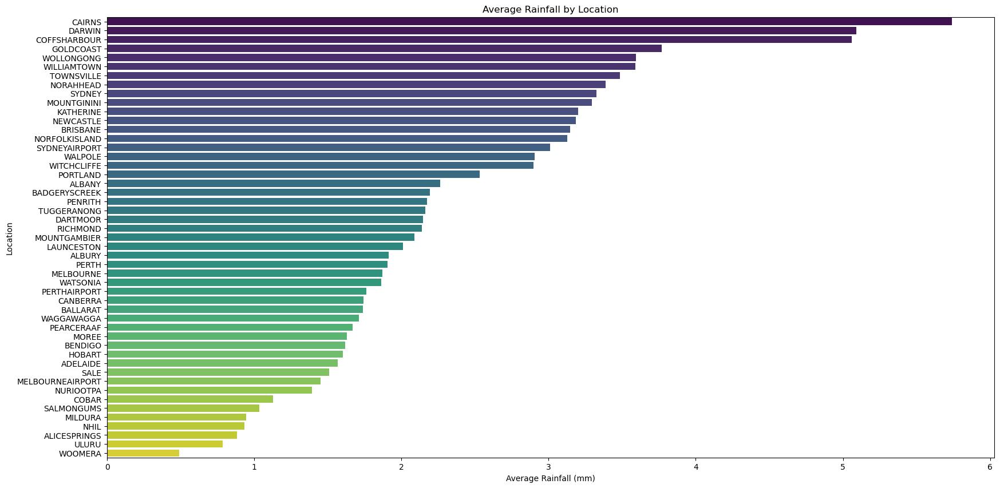

In [159]:
import seaborn as sns
# Set up the matplotlib figure
plt.figure(figsize=(20, 10))

# Create a bar chart for average rainfall by location
sns.barplot(x='mean', y='Location', data=rainfall_by_location, palette='viridis')

# Add labels and title
plt.xlabel('Average Rainfall (mm)')
plt.ylabel('Location')
plt.title('Average Rainfall by Location')

# Show the plot
plt.show()

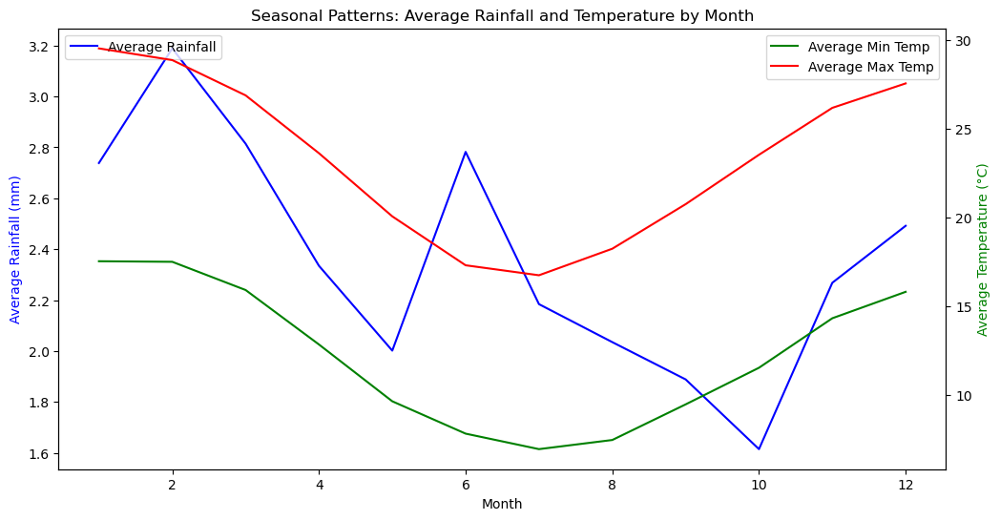

In [160]:
# # Convert the 'Date' column to datetime format for easier manipulation
# df['Date'] = pd.to_datetime(df['Date'])

# Extract the month and year from the date
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month

# Calculate the average rainfall and temperature by month
monthly_avg = df.groupby('Month').agg({
    'Rainfall': 'mean',
    'MinTemp': 'mean',
    'MaxTemp': 'mean'
}).reset_index()

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 6))

# Twin the axes for two different y-axes
ax2 = ax1.twinx()

# Plot data
sns.lineplot(x='Month', y='Rainfall', data=monthly_avg, ax=ax1, label='Average Rainfall', color='b')
sns.lineplot(x='Month', y='MinTemp', data=monthly_avg, ax=ax2, label='Average Min Temp', color='g')
sns.lineplot(x='Month', y='MaxTemp', data=monthly_avg, ax=ax2, label='Average Max Temp', color='r')

# Add labels and title
ax1.set_xlabel('Month')
ax1.set_ylabel('Average Rainfall (mm)', color='b')
ax2.set_ylabel('Average Temperature (°C)', color='g')
ax1.set_title('Seasonal Patterns: Average Rainfall and Temperature by Month')

# Add a legend
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.show()

In [161]:
# import math

# locations_to_consider = ['Sydney', 'Perth', 'Canberra', 'Adelaide', 'Darwin', 'Hobart','Witchcliffe']

# # Filter the dataset to only include these locations
# df_filtered = df[df['Location'].isin(locations_to_consider)]
# df.head()
# Calculate the average rainfall and temperature by month for each selected location
# monthly_avg_by_location = df.groupby(['Location', 'Month']).agg({
#     'Rainfall': 'mean',
#     'MinTemp': 'mean',
#     'MaxTemp': 'mean'
# }).reset_index()

# # Determine the number of rows and columns for the subplots
# num_locations = len(locations_to_consider)
# num_cols = 3  # You can change this to fit your layout preference
# num_rows = math.ceil(num_locations / num_cols)

# # Plotting
# fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 6), sharex=True, sharey=False)
# fig.suptitle('Seasonal Patterns: Average Rainfall and Temperature by Month for Selected Locations')

# # Flatten the axes for easier iteration
# if axes.ndim > 1:
#     axes = axes.flatten()

# # Plot data for each location
# for i, location in enumerate(locations_to_consider):
#     ax1 = axes[i]
#     ax2 = ax1.twinx()
    
#     location_data = monthly_avg_by_location[monthly_avg_by_location['Location'] == location]
    
#     sns.lineplot(x='Month', y='Rainfall', data=location_data, ax=ax1, label='Average Rainfall', color='b')
#     sns.lineplot(x='Month', y='MinTemp', data=location_data, ax=ax2, label='Average Min Temp', color='g')
#     sns.lineplot(x='Month', y='MaxTemp', data=location_data, ax=ax2, label='Average Max Temp', color='r')
    
#     ax1.set_title(location)
#     ax1.set_xlabel('Month')
#     ax1.set_ylabel('Average Rainfall (mm)', color='b')
#     ax2.set_ylabel('Average Temperature (°C)', color='g')
    
#     ax1.legend(loc='upper left')
#     ax2.legend(loc='upper right')

# # Remove empty subplots
# for i in range(num_locations, len(axes)):
#     fig.delaxes(axes[i])

# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.show()


SyntaxError: invalid syntax (1235574172.py, line 8)

<h3>Monthly Variability: Investigate how much the rainfall varies from month to month within each location.</h3>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


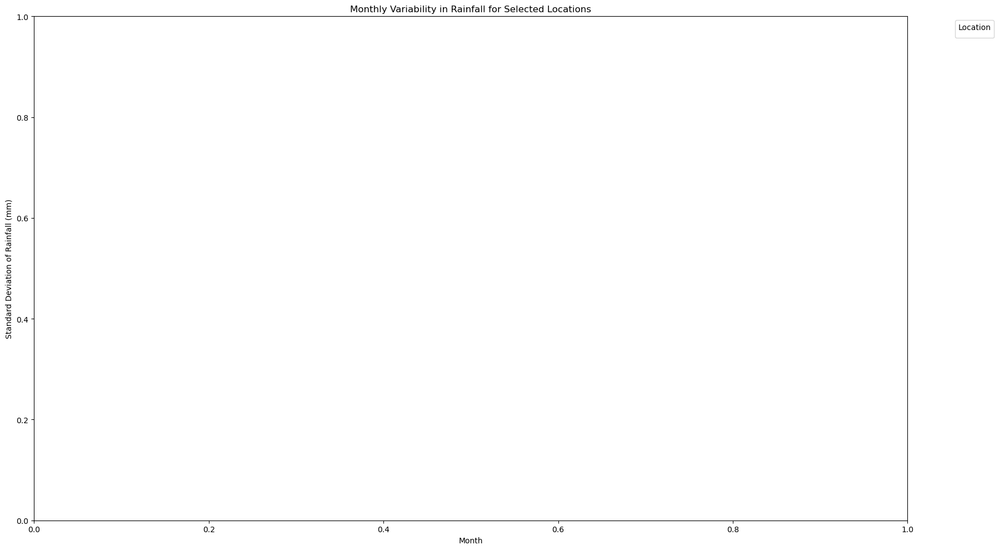

In [162]:
# Calculate the standard deviation of monthly rainfall for each selected location
monthly_variability = df_filtered.groupby(['Location', 'Month'])['Rainfall'].std().reset_index()

# Plotting
plt.figure(figsize=(18, 10))
sns.lineplot(x='Month', y='Rainfall', hue='Location', data=monthly_variability, marker='o')
plt.title('Monthly Variability in Rainfall for Selected Locations')
plt.xlabel('Month')
plt.ylabel('Standard Deviation of Rainfall (mm)')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


**Observations**

**Cairns and Darwin:** These locations exhibit higher variability, especially in the wetter months at the beginning of the year. This could indicate that they experience both very dry and very wet days during these months, making the rainfall more unpredictable.

**Other Cities:** Locations like Sydney, Perth, and Canberra show relatively lower variability, suggesting that rainfall might be more consistent throughout the year.

**Seasonal Patterns:** Some locations exhibit a seasonal pattern in their variability. For example, Cairns has increased variability at the start and end of the year.

**Yearly Trends:** Examine if there are any long-term trends in rainfall. Is it increasing or decreasing over the years

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


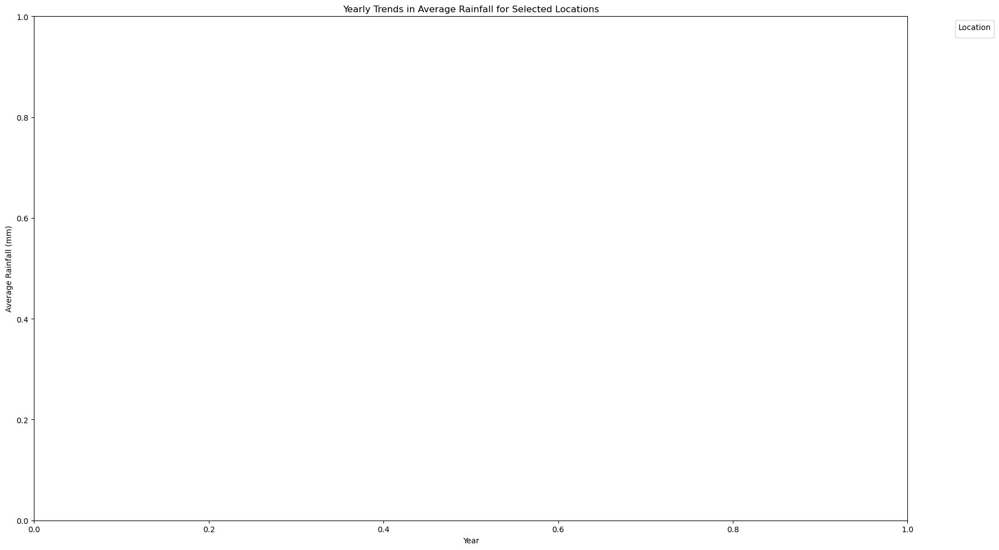

In [163]:
# Calculate the average rainfall by year for each selected location
yearly_avg_rainfall = df_filtered.groupby(['Location', 'Year'])['Rainfall'].mean().reset_index()

# Plotting
plt.figure(figsize=(18, 10))
sns.lineplot(x='Year', y='Rainfall', hue='Location', data=yearly_avg_rainfall, marker='o')
plt.title('Yearly Trends in Average Rainfall for Selected Locations')
plt.xlabel('Year')
plt.ylabel('Average Rainfall (mm)')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

**Observations**

**Variable Trends:** Different locations show different trends. For example, Cairns appears to have experienced some years with notably higher average rainfall, while other locations like Sydney and Perth seem to have more stable yearly averages.

**Short-Term Fluctuations:** There are fluctuations in the average rainfall for most locations, indicating that a single year's increase or decrease does not necessarily represent a long-term trend.

**Data Sparsity:** For some locations, the data is sparse in the earlier years, which could affect the reliability of the trend for those years.

<h3>Extreme Events: Identify and analyze the days or months with extreme rainfall events. How often do they happen, and is there a pattern</h3>

In [164]:
import pandas as pd

# Load the provided dataset
data = pd.read_csv('aus.csv')

# Examine the first few rows of the 'Rainfall' column
data['Rainfall'].head()

0    0.6
1    0.0
2    0.0
3    0.0
4    1.0
Name: Rainfall, dtype: float64

In [165]:
# 1. Filter out zero and near-zero values
filtered_rainfall = data[data['Rainfall'] > 1]['Rainfall']

# 2. Calculate the Interquartile Range (IQR)
Q1 = filtered_rainfall.quantile(0.25)
Q3 = filtered_rainfall.quantile(0.75)
IQR = Q3 - Q1

# 3. Determine the threshold using Q3 + 1.5 x IQR
iqr_threshold = Q3 + 1.5 * IQR

# 4. Calculate the 95th percentile on the filtered data
percentile_95_threshold = filtered_rainfall.quantile(0.95)

iqr_threshold, percentile_95_threshold


(25.900000000000002, 35.4)

In [166]:
# 1. Identify Extreme Rainfall Days
data['ExtremeRainfall'] = data['Rainfall'] > percentile_95_threshold

# 2. Monthly Analysis
data['Year'] = pd.to_datetime(data['Date']).dt.year
data['Month'] = pd.to_datetime(data['Date']).dt.month

# Count the number of extreme rainfall days in each month
monthly_extreme_counts = data.groupby(['Year', 'Month'])['ExtremeRainfall'].sum().reset_index()

# 3. Yearly Analysis
yearly_extreme_counts = data.groupby('Year')['ExtremeRainfall'].sum().reset_index()

monthly_extreme_counts, yearly_extreme_counts.head()

(     Year  Month  ExtremeRainfall
 0    2007     11                1
 1    2007     12                0
 2    2008      1                0
 3    2008      2                1
 4    2008      3                0
 ..    ...    ...              ...
 108  2017      2               27
 109  2017      3               42
 110  2017      4               10
 111  2017      5                7
 112  2017      6               18
 
 [113 rows x 3 columns],
    Year  ExtremeRainfall
 0  2007                1
 1  2008               20
 2  2009              152
 3  2010              223
 4  2011              241)

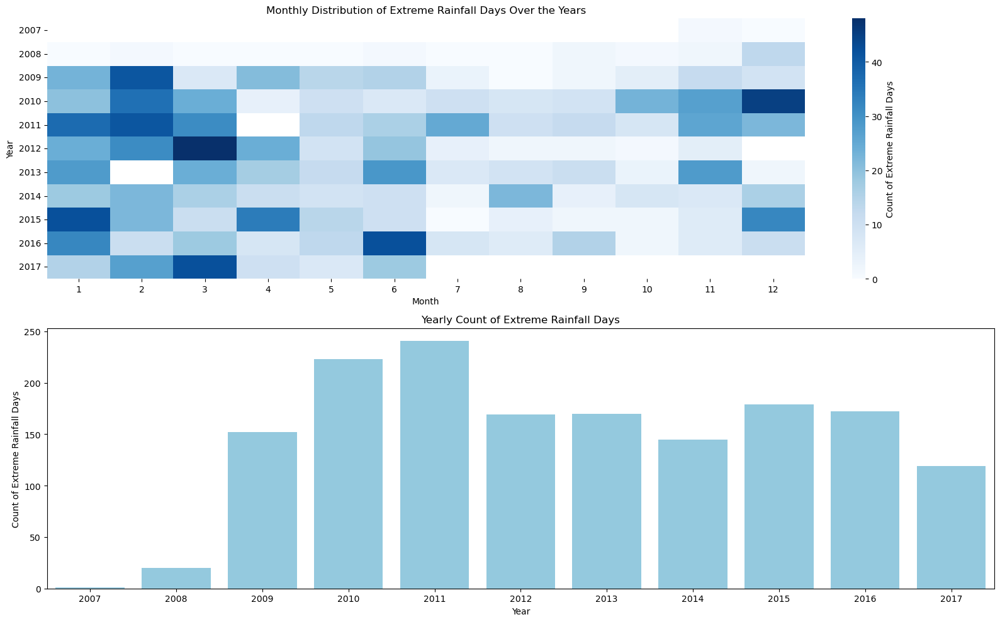

In [167]:
# Use pivot_table for the heatmap
heatmap_data = monthly_extreme_counts.pivot_table(index='Year', columns='Month', values='ExtremeRainfall', aggfunc='sum')

# Set up the plot
fig, ax = plt.subplots(2, 1, figsize=(16, 10))

# 1. Heatmap for Monthly Analysis
sns.heatmap(heatmap_data, cmap='Blues', ax=ax[0], cbar_kws={'label': 'Count of Extreme Rainfall Days'})
ax[0].set_title('Monthly Distribution of Extreme Rainfall Days Over the Years')

# 2. Bar Chart for Yearly Analysis
sns.barplot(x='Year', y='ExtremeRainfall', data=yearly_extreme_counts, ax=ax[1], color='skyblue')
ax[1].set_title('Yearly Count of Extreme Rainfall Days')
ax[1].set_ylabel('Count of Extreme Rainfall Days')

plt.tight_layout()
plt.show()


In [168]:
# Selected regions
selected_regions = ['Sydney', 'Perth', 'Canberra', 'Adelaide', 'Darwin', 'Hobart']

# Define a function to compute the thresholds for each city
def compute_thresholds(city_data):
    # 1. Filter out zero and near-zero values
    filtered_rainfall = city_data[city_data['Rainfall'] > 1]['Rainfall']

    # 2. Calculate the Interquartile Range (IQR)
    Q1 = filtered_rainfall.quantile(0.25)
    Q3 = filtered_rainfall.quantile(0.75)
    IQR = Q3 - Q1

    # 3. Determine the threshold using Q3 + 1.5 x IQR
    iqr_threshold = Q3 + 1.5 * IQR

    # 4. Calculate the 95th percentile on the filtered data
    percentile_95_threshold = filtered_rainfall.quantile(0.95)
    
    return iqr_threshold, percentile_95_threshold

# Compute thresholds for each selected city
thresholds = {city: compute_thresholds(filtered_data[filtered_data['Location'] == city]) for city in selected_regions}
thresholds_df = pd.DataFrame(thresholds, index=['IQR Threshold', '95th Percentile']).transpose()
thresholds_df


NameError: name 'filtered_data' is not defined

In [ ]:

# 1. Filter the data for the selected regions
filtered_data = data[data['Location'].isin(selected_regions)]

# 2. Monthly Analysis for each region
monthly_region_extreme_counts = filtered_data.groupby(['Location', 'Year', 'Month'])['ExtremeRainfall'].sum().reset_index()

# Visualize the results using heatmaps
fig, axs = plt.subplots(len(selected_regions), 1, figsize=(16, 18))

for i, region in enumerate(selected_regions):
    region_data = monthly_region_extreme_counts[monthly_region_extreme_counts['Location'] == region].pivot_table(index='Year', columns='Month', values='ExtremeRainfall', aggfunc='sum')
    sns.heatmap(region_data, cmap='Blues', ax=axs[i], cbar_kws={'label': 'Count of Extreme Rainfall Days'})
    axs[i].set_title(f'Monthly Distribution of Extreme Rainfall Days for {region}')

plt.tight_layout()
plt.show()


In [ ]:
# 3. Yearly Analysis for each region
yearly_region_extreme_counts = filtered_data.groupby(['Location', 'Year'])['ExtremeRainfall'].sum().reset_index()

# Visualize the results using bar charts
fig, axs = plt.subplots(len(selected_regions), 1, figsize=(16, 18))

for i, region in enumerate(selected_regions):
    region_data = yearly_region_extreme_counts[yearly_region_extreme_counts['Location'] == region]
    sns.barplot(x='Year', y='ExtremeRainfall', data=region_data, ax=axs[i], color='skyblue')
    axs[i].set_title(f'Yearly Count of Extreme Rainfall Days for {region}')
    axs[i].set_ylabel('Count of Extreme Rainfall Days')

plt.tight_layout()
plt.show()


In [ ]:
# Calculate the average rainfall by year for each selected location
yearly_avg_rainfall = df_filtered.groupby(['Location', 'Year'])['Rainfall'].mean().reset_index()

# Plotting
plt.figure(figsize=(18, 10))
sns.lineplot(x='Year', y='Rainfall', hue='Location', data=yearly_avg_rainfall, marker='o')
plt.title('Yearly Trends in Average Rainfall for Selected Locations')
plt.xlabel('Year')
plt.ylabel('Average Rainfall (mm)')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


**Observations**

**Variable Trends:** Different locations show different trends. For example, Cairns appears to have experienced some years with notably higher average rainfall, while other locations like Sydney and Perth seem to have more stable yearly averages.

**Short-Term Fluctuations:** There are fluctuations in the average rainfall for most locations, indicating that a single year's increase or decrease does not necessarily represent a long-term trend.

**Data Sparsity:** For some locations, the data is sparse in the earlier years, which could affect the reliability of the trend for those years.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for seaborn
sns.set(style="whitegrid")

# Initialize the figure
plt.figure(figsize=(20, 15))

# Create a list of numerical columns to visualize
numerical_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 
                     'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 
                     'Humidity9am', 'Humidity3pm', 
                     'Pressure9am', 'Pressure3pm', 
                     'Temp9am', 'Temp3pm']

# Create subplots for each column
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(df[column], bins=30, kde=False, color='skyblue')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
# Initialize the figure
plt.figure(figsize=(20, 12))

# Create a list of categorical columns to visualize
categorical_columns = ['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

# Create subplots for each column
for i, column in enumerate(categorical_columns, 1):
    plt.subplot(2, 3, i)
    sns.countplot(data=df, x=column, order=df[column].value_counts().index, palette='viridis')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
# Initialize the figure
plt.figure(figsize=(20, 15))

# List of numerical features to visualize
numerical_features_to_compare = ['MaxTemp', 'Rainfall', 'WindGustSpeed']

# Create subplots for each combination of numerical feature and categorical feature ('RainToday' and 'RainTomorrow')
for i, num_feature in enumerate(numerical_features_to_compare, 1):
    for j, cat_feature in enumerate(['RainToday', 'RainTomorrow'], 1):
        plt.subplot(3, 2, 2*(i-1) + j)
        sns.boxplot(data=df, x=cat_feature, y=num_feature, palette='coolwarm')
        plt.title(f'{num_feature} vs {cat_feature}')
        plt.xlabel(cat_feature)
        plt.ylabel(num_feature)

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
# Initialize the figure
plt.figure(figsize=(20, 15))

# List of numerical features to compare with 'Rainfall'
features_to_compare_with_rainfall = ['MaxTemp', 'MinTemp', 'WindGustSpeed', 'Humidity9am', 'Pressure9am']

# Create subplots for each feature to compare with 'Rainfall'
for i, feature in enumerate(features_to_compare_with_rainfall, 1):
    plt.subplot(2, 3, i)
    sns.scatterplot(data=df, x='Rainfall', y=feature, alpha=0.5, color='green')
    plt.title(f'Rainfall vs {feature}')
    plt.xlabel('Rainfall')
    plt.ylabel(feature)

# Adjust layout
plt.tight_layout()
plt.show()

 # MODEL BUILDING

In [180]:
import pandas as pd
df = pd.read_csv('aus.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


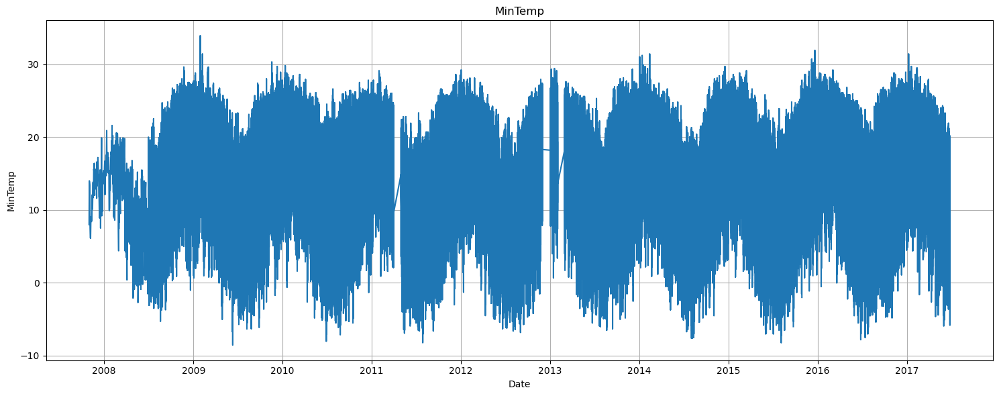

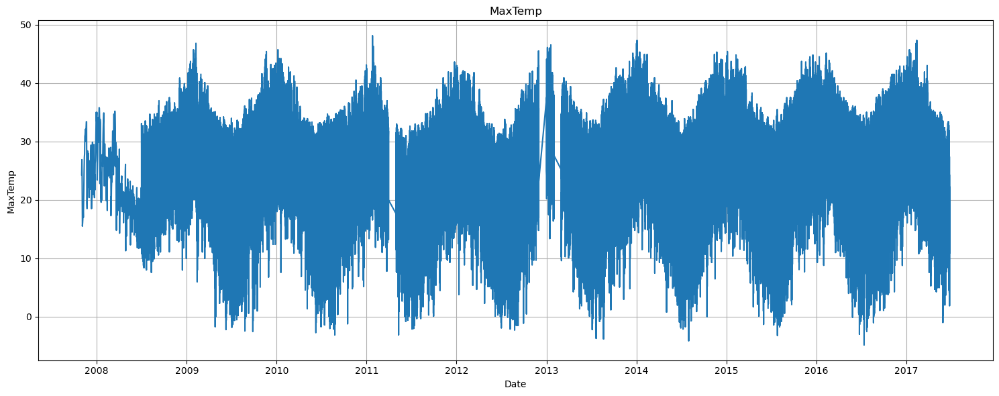

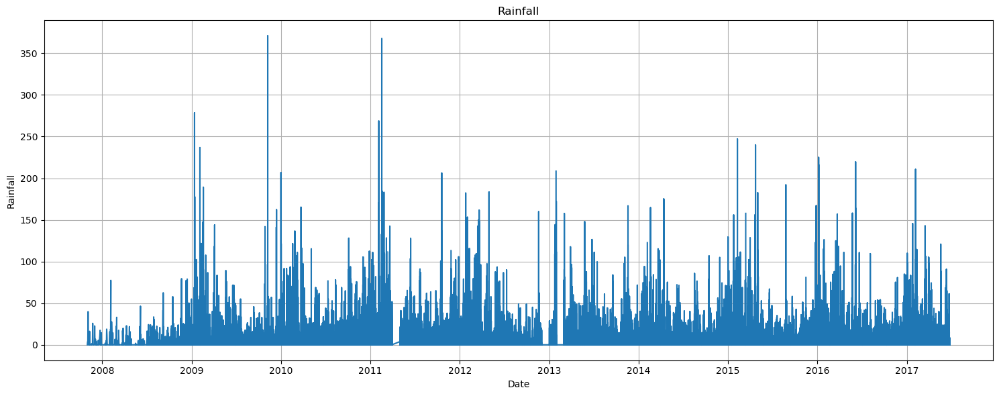

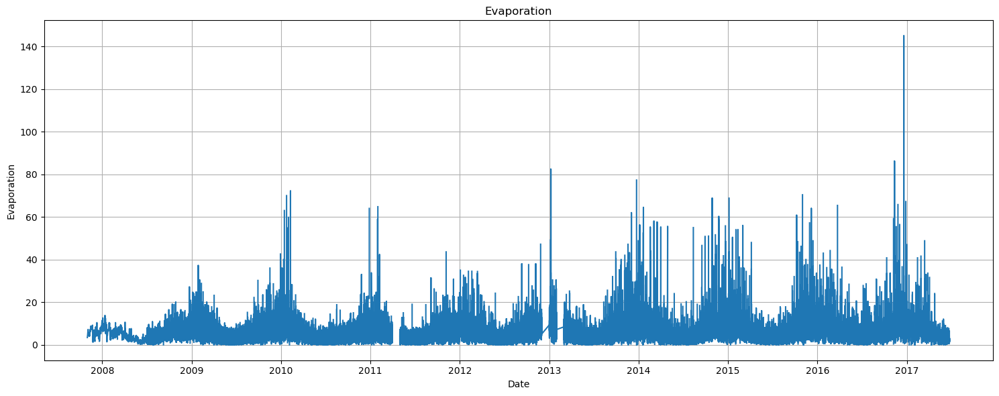

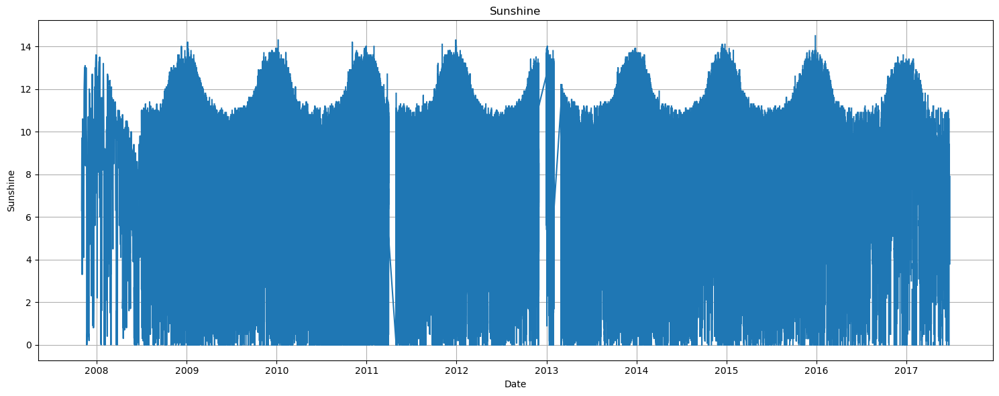

...

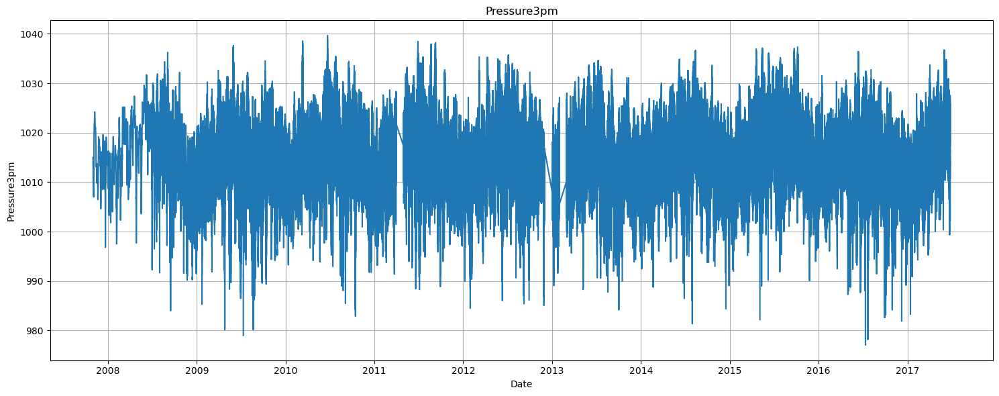

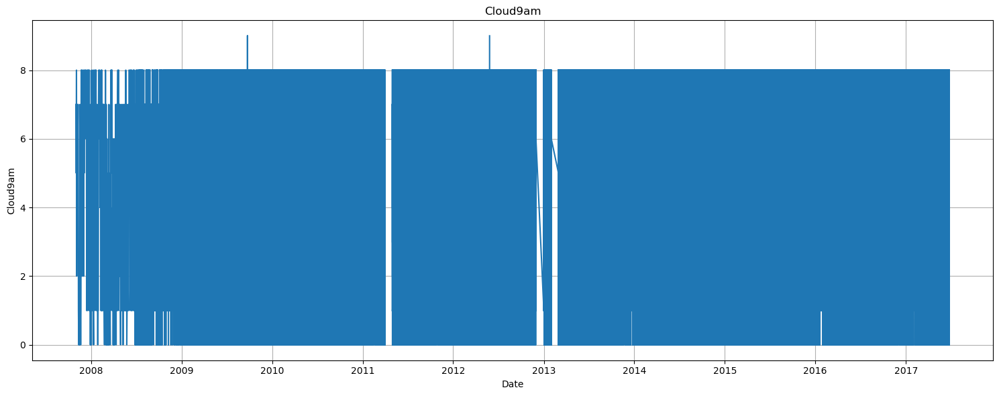

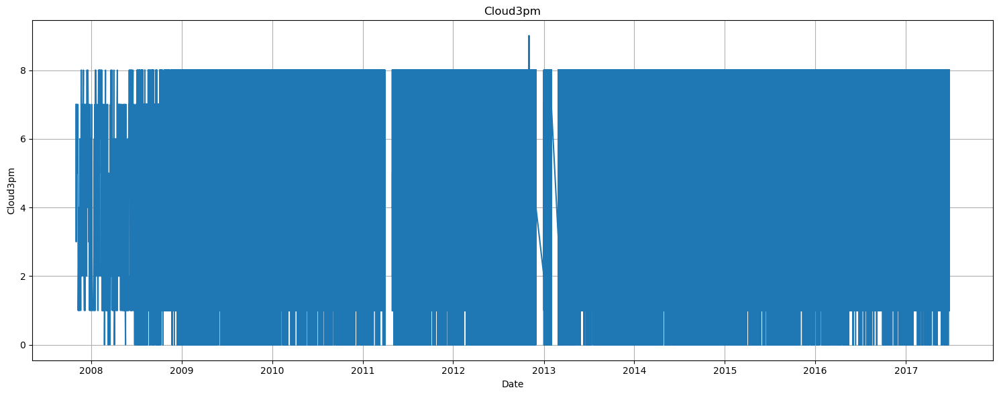

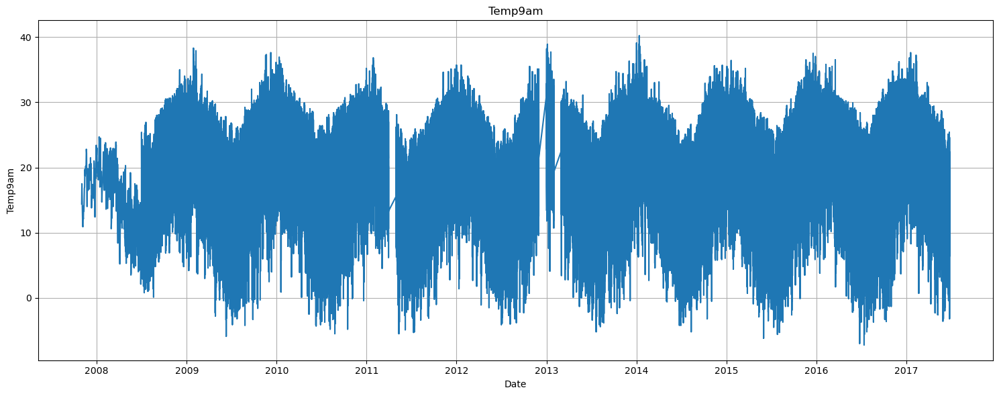

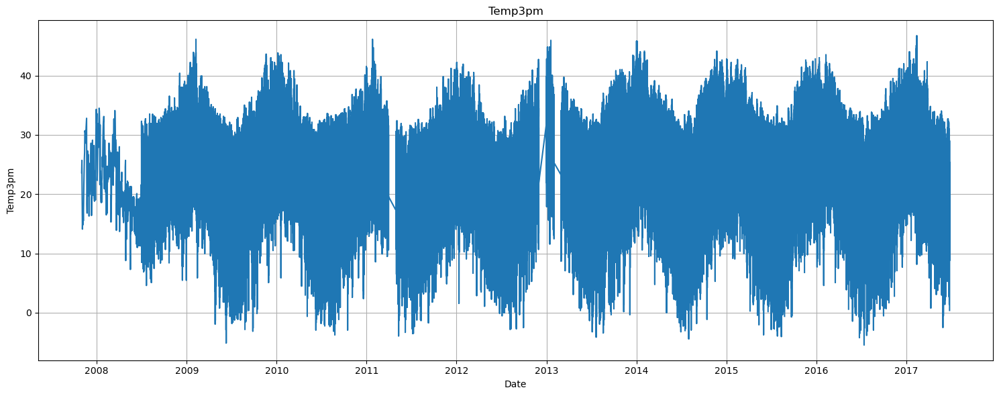

In [181]:
import matplotlib.pyplot as plt

# Extracting only numerical columns
numerical_columns = df_sorted.select_dtypes(include=['float64']).columns

# Creating time series plots for each numerical column
for column in numerical_columns:
    plt.figure(figsize=(15, 6))
    plt.plot(df_sorted['Date'], df_sorted[column])
    plt.title(column)
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [182]:
# Remove rows with Date before 2013
df = df[pd.to_datetime(df['Date']) >= '2013-01-01']

# Sort the dataset by Location and then by Date
df = df.sort_values(by=['Location', 'Date'])

# Display the first few rows of the processed dataset
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
97904,2013-01-01,Adelaide,14.4,30.8,0.0,NaN,13.9,W,37.0,SW,...,28.0,30.0,1016.4,1015.6,NaN,NaN,23.7,28.5,No,No
97905,2013-01-02,Adelaide,14.9,32.2,0.0,15.6,13.5,W,28.0,W,...,53.0,33.0,1017.6,1014.7,NaN,NaN,21.0,31.5,No,No
97906,2013-01-03,Adelaide,20.8,40.6,0.0,9.8,13.8,W,37.0,NE,...,14.0,11.0,1013.6,1009.0,NaN,NaN,29.9,39.2,No,No
97907,2013-01-04,Adelaide,24.3,45.0,0.0,11.4,13.2,NW,39.0,N,...,7.0,5.0,1004.8,1002.8,NaN,NaN,37.3,44.3,No,No
97908,2013-01-05,Adelaide,20.4,32.2,0.0,NaN,13.1,SE,41.0,WNW,...,37.0,22.0,1013.3,1014.9,NaN,NaN,25.2,31.5,No,No


In [183]:
# Get the number of columns and rows in the dataset
num_rows, num_columns = df.shape

num_rows, num_columns

(78742, 23)

,Missing Values,Percentage
Sunshine,44554,56.582256
Evaporation,38959,49.476772
Cloud3pm,35267,44.788042
Cloud9am,32701,41.529298
Pressure9am,8663,11.001753
Pressure3pm,8637,10.968733
WindDir9am,5406,6.865459
WindGustDir,4704,5.973940
WindGustSpeed,4654,5.910442
Humidity3pm,3358,4.264560


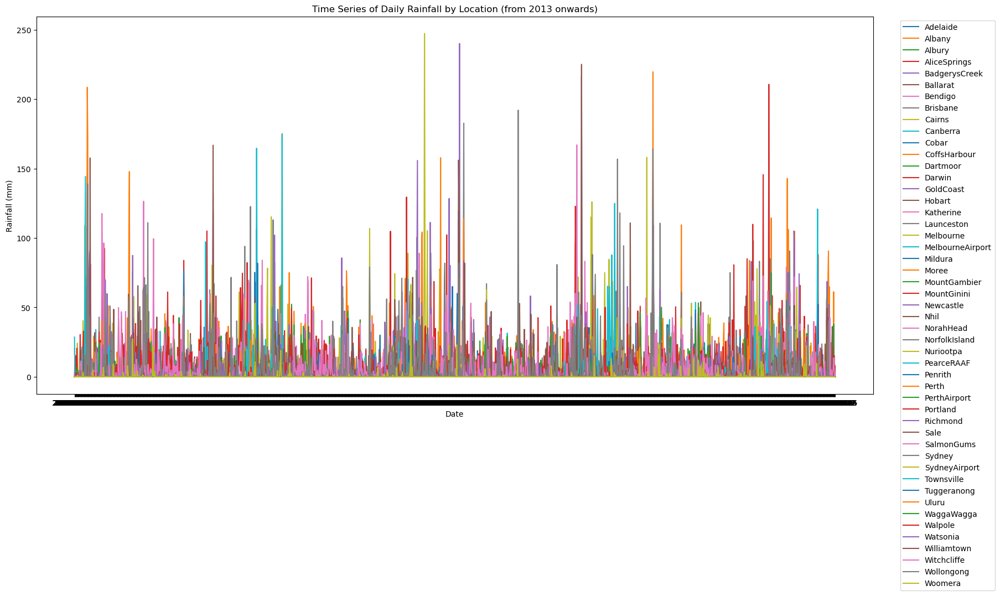

In [184]:
# Group by Date and Location, and then sum the rainfall data
rainfall_time_series = df.groupby(['Date', 'Location'])['Rainfall'].sum().unstack()

# Plot the time series data for each location
plt.figure(figsize=(18, 10))
for column in rainfall_time_series.columns:
    plt.plot(rainfall_time_series.index, rainfall_time_series[column], label=column)

plt.title('Time Series of Daily Rainfall by Location (from 2013 onwards)')
plt.xlabel('Date')
plt.ylabel('Rainfall (mm)')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
plt.tight_layout()
plt.show()


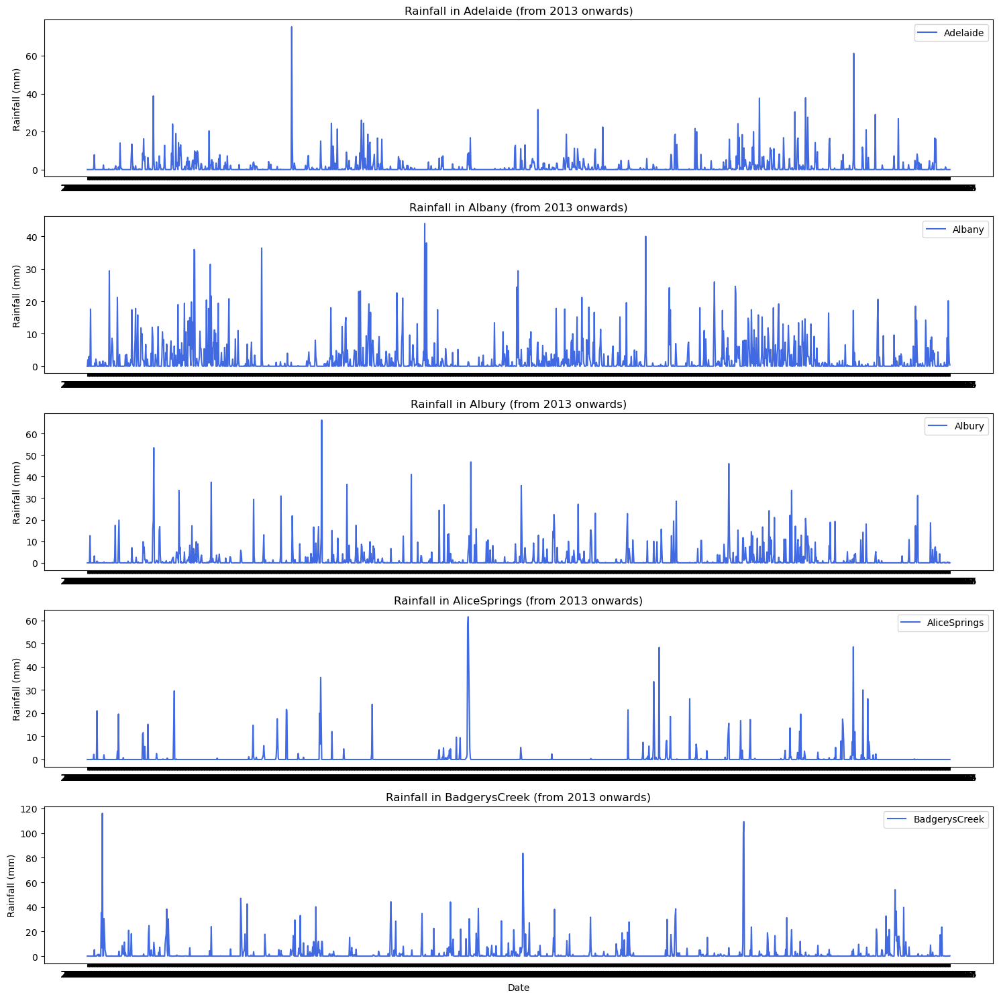

In [185]:
# Number of locations to display as a sample (for clarity)
sample_size = 5
sample_locations = rainfall_time_series.columns[:sample_size]

# Plot separate time series graphs for each of the sample locations
fig, axes = plt.subplots(sample_size, 1, figsize=(15, 15))

for idx, location in enumerate(sample_locations):
    axes[idx].plot(rainfall_time_series.index, rainfall_time_series[location], label=location, color='royalblue')
    axes[idx].set_title(f"Rainfall in {location} (from 2013 onwards)")
    axes[idx].set_ylabel("Rainfall (mm)")
    axes[idx].legend(loc='upper right')

axes[-1].set_xlabel("Date")
plt.tight_layout()
plt.show()

In [176]:
# Calculate the percentage of missing data for each column grouped by location
missing_data_by_location = data_sorted.groupby('Location').apply(lambda x: (x.isnull().sum() / len(x)) * 100)

missing_data_by_location

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,,,,,,,,,,,,,,,,,,,,,
Adelaide,0.0,0.0,0.062150,0.124301,3.169671,62.709758,72.343070,0.621504,0.621504,10.068365,...,0.124301,0.124301,0.310752,0.248602,100.000000,100.000000,0.124301,0.124301,3.169671,3.231821
Albany,0.0,0.0,3.356122,3.231821,1.491610,16.345556,30.267247,100.000000,100.000000,8.141703,...,2.858919,43.878185,0.248602,0.435053,2.237415,43.753884,2.361715,43.753884,1.491610,1.429459
Albury,0.0,0.0,0.186451,0.186451,0.870106,100.000000,100.000000,0.497203,0.497203,15.599751,...,0.372902,0.124301,0.124301,0.124301,54.940957,48.353014,0.372902,0.124301,0.870106,0.870106
AliceSprings,0.0,0.0,0.062150,0.124301,0.497203,12.181479,29.334991,0.559354,0.559354,8.514605,...,0.186451,0.124301,0.062150,0.062150,19.515227,18.458670,0.000000,0.000000,0.497203,0.559354
BadgerysCreek,0.0,0.0,1.553760,1.553760,2.299565,100.000000,100.000000,2.237415,2.237415,12.243630,...,2.175264,1.926663,9.446861,9.260410,100.000000,100.000000,1.367309,1.243008,2.299565,2.299565
Ballarat,0.0,0.0,0.000000,0.062150,0.310752,100.000000,100.000000,0.372902,0.372902,2.672467,...,0.870106,0.124301,0.497203,0.435053,30.888751,31.448104,0.372902,0.062150,0.310752,0.310752
Bendigo,0.0,0.0,0.062150,0.248602,0.372902,75.264139,100.000000,0.621504,0.621504,8.949658,...,0.124301,0.062150,0.062150,0.062150,56.308266,44.251088,0.062150,0.062150,0.372902,0.372902
Brisbane,0.0,0.0,0.372902,0.683654,1.180858,0.745805,0.248602,1.678061,1.678061,2.113114,...,0.124301,0.435053,0.000000,0.000000,0.062150,0.000000,0.124301,0.435053,1.180858,1.180858
Cairns,0.0,0.0,0.062150,0.000000,3.169671,21.752641,29.334991,0.870106,0.807955,0.435053,...,0.062150,0.000000,0.062150,0.000000,12.678682,13.859540,0.062150,0.000000,3.169671,3.169671


In [177]:
# Calculate the total missing data percentage for each location
total_missing_data_by_location = missing_data_by_location.mean(axis=1)

# Identify the location with the minimum missing data percentage
min_missing_data_location = total_missing_data_by_location.idxmin()
min_missing_percentage = total_missing_data_by_location.min()

min_missing_data_location, min_missing_percentage

('MelbourneAirport', 0.12970519090982788)

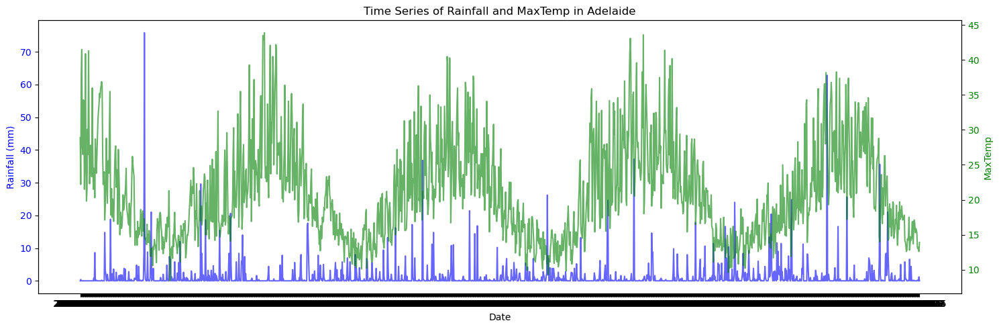

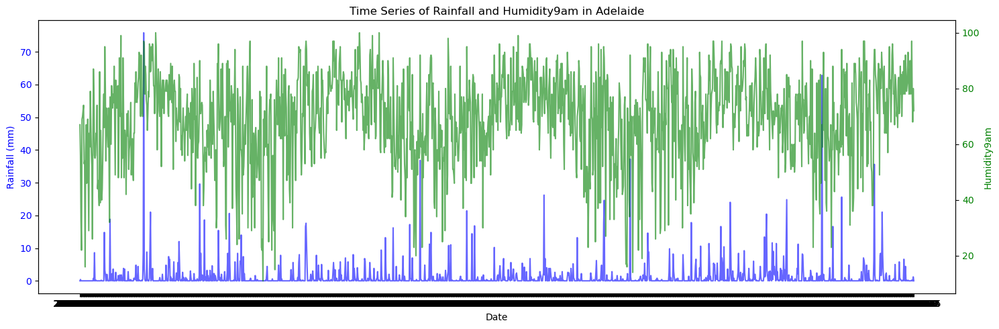

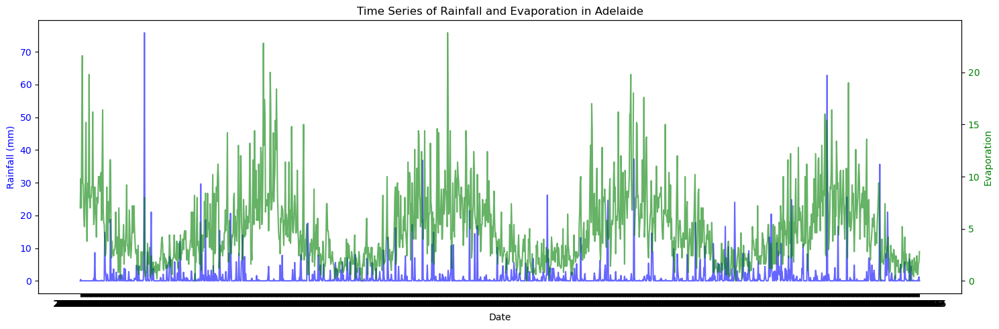

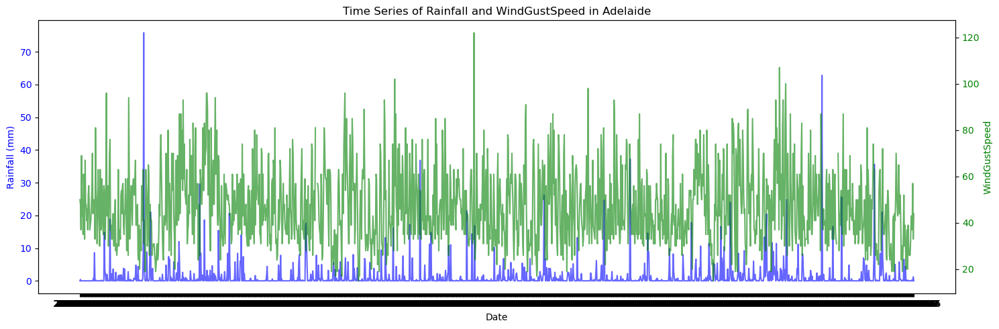

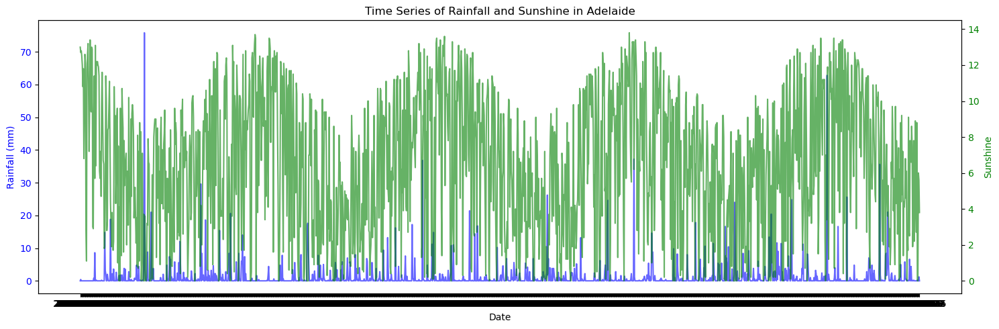

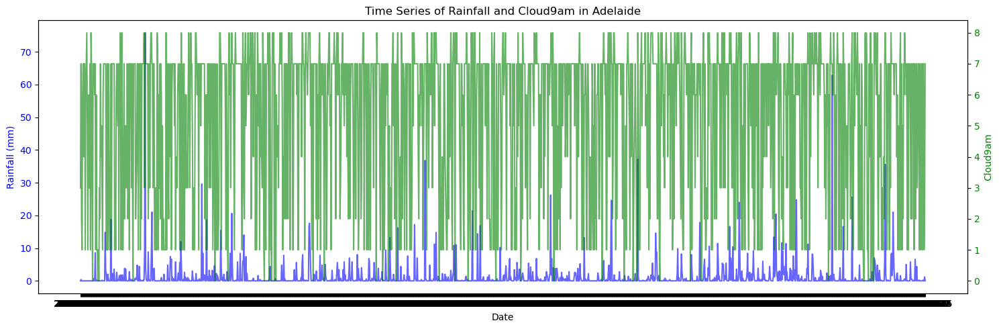

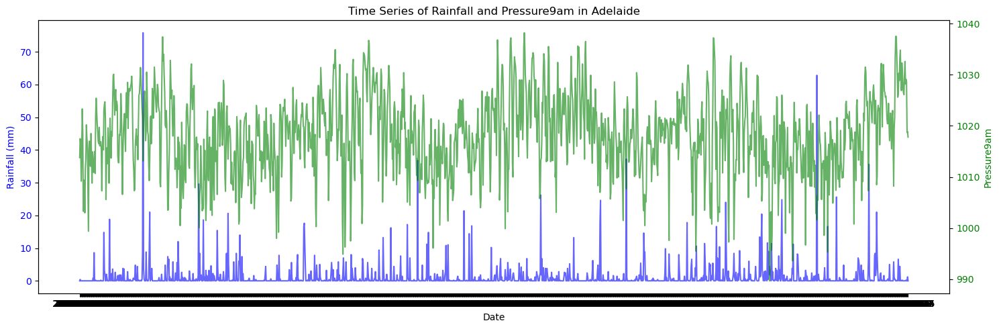

In [178]:
location_data = data_sorted[data_sorted['Location'] == 'MelbourneAirport']

columns_to_compare = ['MaxTemp', 'Humidity9am', 'Evaporation', 'WindGustSpeed', 'Sunshine', 'Cloud9am', 'Pressure9am']
# Plotting time series relationships for each column
for column in columns_to_compare:
    fig, ax1 = plt.subplots(figsize=(15, 5))
    
    # Plotting Rainfall data
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Rainfall (mm)', color='blue')
    ax1.plot(location_data['Date'], location_data['Rainfall'], color='blue', alpha=0.6, label='Rainfall')
    ax1.tick_params(axis='y', labelcolor='blue')
    
    # Creating a second y-axis to plot the other column
    ax2 = ax1.twinx()
    ax2.set_ylabel(column, color='green')
    ax2.plot(location_data['Date'], location_data[column], color='green', alpha=0.6, label=column)
    ax2.tick_params(axis='y', labelcolor='green')
    
    # Title and show plot
    plt.title(f"Time Series of Rainfall and {column} in {single_location}")
    plt.tight_layout()
    plt.show()

In [186]:
# 1. Filter out zero and near-zero values
filtered_rainfall = df[df['Rainfall'] > 1]['Rainfall']

# 2. Calculate the Interquartile Range (IQR)
Q1 = filtered_rainfall.quantile(0.25)
Q3 = filtered_rainfall.quantile(0.75)
IQR = Q3 - Q1

# 3. Determine the threshold using Q3 + 1.5 x IQR
iqr_threshold = Q3 + 1.5 * IQR

# 4. Calculate the 95th percentile on the filtered data
percentile_95_threshold = filtered_rainfall.quantile(0.95)

iqr_threshold, percentile_95_threshold

(24.9, 34.4)

In [188]:
# 1. Identify Extreme Rainfall Days
data['ExtremeRainfall'] = df['Rainfall'] > percentile_95_threshold

# 2. Monthly Analysis
data['Year'] = pd.to_datetime(df['Date']).dt.year
data['Month'] = pd.to_datetime(df['Date']).dt.month

# Count the number of extreme rainfall days in each month
monthly_extreme_counts = data.groupby(['Year', 'Month'])['ExtremeRainfall'].sum().reset_index()

# 3. Yearly Analysis
yearly_extreme_counts = data.groupby('Year')['ExtremeRainfall'].sum().reset_index()

monthly_extreme_counts, yearly_extreme_counts.head()

(      Year  Month ExtremeRainfall
 0   2013.0    1.0              30
 1   2013.0    3.0              24
 2   2013.0    4.0              17
 3   2013.0    5.0              12
 4   2013.0    6.0              30
 5   2013.0    7.0               8
 6   2013.0    8.0              10
 7   2013.0    9.0              11
 8   2013.0   10.0               3
 9   2013.0   11.0              30
 10  2013.0   12.0               3
 11  2014.0    1.0              18
 12  2014.0    2.0              22
 13  2014.0    3.0              17
 14  2014.0    4.0              14
 15  2014.0    5.0              11
 16  2014.0    6.0              10
 17  2014.0    7.0               2
 18  2014.0    8.0              23
 19  2014.0    9.0               4
 20  2014.0   10.0               9
 21  2014.0   11.0               7
 22  2014.0   12.0              17
 23  2015.0    1.0              43
 24  2015.0    2.0              23
 25  2015.0    3.0              12
 26  2015.0    4.0              36
 27  2015.0    5.0  

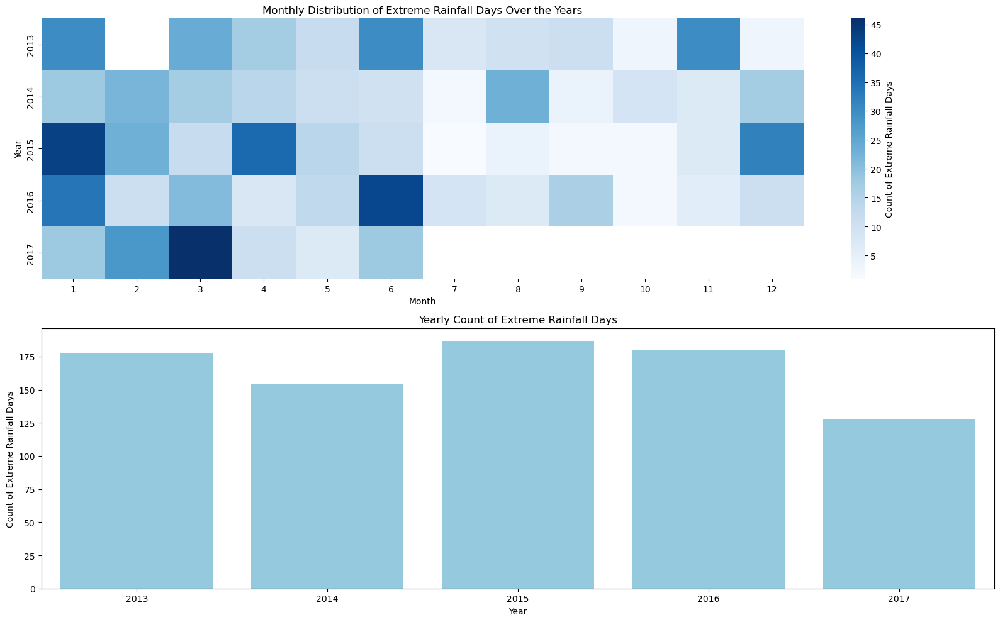

In [193]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is already loaded and percentile_95_threshold is calculated

# 1. Identify Extreme Rainfall Days
data = df.copy() # Create a copy of df to avoid modifying the original data
data['ExtremeRainfall'] = data['Rainfall'] > percentile_95_threshold

# 2. Monthly Analysis
data['Year'] = pd.to_datetime(data['Date']).dt.year
data['Month'] = pd.to_datetime(data['Date']).dt.month

# Count the number of extreme rainfall days in each month
monthly_extreme_counts = data.groupby(['Year', 'Month'])['ExtremeRainfall'].sum().reset_index()

# 3. Yearly Analysis
yearly_extreme_counts = data.groupby('Year')['ExtremeRainfall'].sum().reset_index()

# Plotting
heatmap_data = monthly_extreme_counts.pivot_table(index='Year', columns='Month', values='ExtremeRainfall', aggfunc='sum')

fig, ax = plt.subplots(2, 1, figsize=(16, 10))

# 1. Heatmap for Monthly Analysis
sns.heatmap(heatmap_data, cmap='Blues', ax=ax[0], cbar_kws={'label': 'Count of Extreme Rainfall Days'})
ax[0].set_title('Monthly Distribution of Extreme Rainfall Days Over the Years')

# 2. Bar Chart for Yearly Analysis
sns.barplot(x='Year', y='ExtremeRainfall', data=yearly_extreme_counts, ax=ax[1], color='skyblue')
ax[1].set_title('Yearly Count of Extreme Rainfall Days')
ax[1].set_ylabel('Count of Extreme Rainfall Days')

plt.tight_layout()
plt.show()


In [ ]:
# # Selected regions
# selected_regions = ['Sydney', 'Perth', 'Canberra', 'Adelaide', 'Darwin', 'Hobart']

# # Define a function to compute the thresholds for each city
# def compute_thresholds(city_data):
#     # 1. Filter out zero and near-zero values
#     filtered_rainfall = city_data[city_data['Rainfall'] > 1]['Rainfall']

#     # 2. Calculate the Interquartile Range (IQR)
#     Q1 = filtered_rainfall.quantile(0.25)
#     Q3 = filtered_rainfall.quantile(0.75)
#     IQR = Q3 - Q1

#     # 3. Determine the threshold using Q3 + 1.5 x IQR
#     iqr_threshold = Q3 + 1.5 * IQR

#     # 4. Calculate the 95th percentile on the filtered data
#     percentile_95_threshold = filtered_rainfall.quantile(0.95)
    
#     return iqr_threshold, percentile_95_threshold

# # Compute thresholds for each selected city
# thresholds = {city: compute_thresholds(filtered_data[filtered_data['Location'] == city]) for city in selected_regions}
# thresholds_df = pd.DataFrame(thresholds, index=['IQR Threshold', '95th Percentile']).transpose()
# thresholds_df


In [ ]:

# # 1. Filter the data for the selected regions
# filtered_data = data[data['Location'].isin(selected_regions)]

# # 2. Monthly Analysis for each region
# monthly_region_extreme_counts = filtered_data.groupby(['Location', 'Year', 'Month'])['ExtremeRainfall'].sum().reset_index()

# # Visualize the results using heatmaps
# fig, axs = plt.subplots(len(selected_regions), 1, figsize=(16, 18))

# for i, region in enumerate(selected_regions):
#     region_data = monthly_region_extreme_counts[monthly_region_extreme_counts['Location'] == region].pivot_table(index='Year', columns='Month', values='ExtremeRainfall', aggfunc='sum')
#     sns.heatmap(region_data, cmap='Blues', ax=axs[i], cbar_kws={'label': 'Count of Extreme Rainfall Days'})
#     axs[i].set_title(f'Monthly Distribution of Extreme Rainfall Days for {region}')

# plt.tight_layout()
# plt.show()

In [196]:
# # 3. Yearly Analysis for each region
# yearly_region_extreme_counts = filtered_data.groupby(['Location', 'Year'])['ExtremeRainfall'].sum().reset_index()

# # Visualize the results using bar charts
# fig, axs = plt.subplots(len(selected_regions), 1, figsize=(16, 18))

# for i, region in enumerate(selected_regions):
#     region_data = yearly_region_extreme_counts[yearly_region_extreme_counts['Location'] == region]
#     sns.barplot(x='Year', y='ExtremeRainfall', data=region_data, ax=axs[i], color='skyblue')
#     axs[i].set_title(f'Yearly Count of Extreme Rainfall Days for {region}')
#     axs[i].set_ylabel('Count of Extreme Rainfall Days')

# plt.tight_layout()
# plt.show()
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
97904,2013-01-01,Adelaide,14.4,30.8,0.0,NaN,13.9,W,37.0,SW,...,28.0,30.0,1016.4,1015.6,NaN,NaN,23.7,28.5,No,No
97905,2013-01-02,Adelaide,14.9,32.2,0.0,15.6,13.5,W,28.0,W,...,53.0,33.0,1017.6,1014.7,NaN,NaN,21.0,31.5,No,No
97906,2013-01-03,Adelaide,20.8,40.6,0.0,9.8,13.8,W,37.0,NE,...,14.0,11.0,1013.6,1009.0,NaN,NaN,29.9,39.2,No,No
97907,2013-01-04,Adelaide,24.3,45.0,0.0,11.4,13.2,NW,39.0,N,...,7.0,5.0,1004.8,1002.8,NaN,NaN,37.3,44.3,No,No
97908,2013-01-05,Adelaide,20.4,32.2,0.0,NaN,13.1,SE,41.0,WNW,...,37.0,22.0,1013.3,1014.9,NaN,NaN,25.2,31.5,No,No


In [195]:
# Calculate the average rainfall by year for each selected location
yearly_avg_rainfall = df.groupby(['Location', 'Year'])['Rainfall'].mean().reset_index()

# Plotting
plt.figure(figsize=(18, 10))
sns.lineplot(x='Year', y='Rainfall', hue='Location', data=yearly_avg_rainfall, marker='o')
plt.title('Yearly Trends in Average Rainfall for Selected Locations')
plt.xlabel('Year')
plt.ylabel('Average Rainfall (mm)')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


KeyError: 'Year'

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for seaborn
sns.set(style="whitegrid")

# Initialize the figure
plt.figure(figsize=(20, 15))

# Create a list of numerical columns to visualize
numerical_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 
                     'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 
                     'Humidity9am', 'Humidity3pm', 
                     'Pressure9am', 'Pressure3pm', 
                     'Temp9am', 'Temp3pm']

# Create subplots for each column
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(df[column], bins=30, kde=False, color='skyblue')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
# Initialize the figure
plt.figure(figsize=(20, 12))

# Create a list of categorical columns to visualize
categorical_columns = ['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

# Create subplots for each column
for i, column in enumerate(categorical_columns, 1):
    plt.subplot(2, 3, i)
    sns.countplot(data=df, x=column, order=df[column].value_counts().index, palette='viridis')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
# Initialize the figure
plt.figure(figsize=(20, 15))

# List of numerical features to visualize
numerical_features_to_compare = ['MaxTemp', 'Rainfall', 'WindGustSpeed']

# Create subplots for each combination of numerical feature and categorical feature ('RainToday' and 'RainTomorrow')
for i, num_feature in enumerate(numerical_features_to_compare, 1):
    for j, cat_feature in enumerate(['RainToday', 'RainTomorrow'], 1):
        plt.subplot(3, 2, 2*(i-1) + j)
        sns.boxplot(data=df, x=cat_feature, y=num_feature, palette='coolwarm')
        plt.title(f'{num_feature} vs {cat_feature}')
        plt.xlabel(cat_feature)
        plt.ylabel(num_feature)

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
# Initialize the figure
plt.figure(figsize=(20, 15))

# List of numerical features to compare with 'Rainfall'
features_to_compare_with_rainfall = ['MaxTemp', 'MinTemp', 'WindGustSpeed', 'Humidity9am', 'Pressure9am']

# Create subplots for each feature to compare with 'Rainfall'
for i, feature in enumerate(features_to_compare_with_rainfall, 1):
    plt.subplot(2, 3, i)
    sns.scatterplot(data=df, x='Rainfall', y=feature, alpha=0.5, color='green')
    plt.title(f'Rainfall vs {feature}')
    plt.xlabel('Rainfall')
    plt.ylabel(feature)

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
full_data = df.copy()

In [93]:
full_data['Date'] = pd.to_datetime(full_data['Date'])
full_data['year'] = full_data['Date'].dt.year
full_data['month'] = full_data['Date'].dt.month
full_data['day'] = full_data['Date'].dt.day
full_data.drop(['Date'], axis = 1,inplace=True) 
full_data.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


In [94]:
full_data.shape

(145460, 25)

In [95]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  object 
 1   MinTemp        143975 non-null  float64
 2   MaxTemp        144199 non-null  float64
 3   Rainfall       142199 non-null  float64
 4   Evaporation    82670 non-null   float64
 5   Sunshine       75625 non-null   float64
 6   WindGustDir    135134 non-null  object 
 7   WindGustSpeed  135197 non-null  float64
 8   WindDir9am     134894 non-null  object 
 9   WindDir3pm     141232 non-null  object 
 10  WindSpeed9am   143693 non-null  float64
 11  WindSpeed3pm   142398 non-null  float64
 12  Humidity9am    142806 non-null  float64
 13  Humidity3pm    140953 non-null  float64
 14  Pressure9am    130395 non-null  float64
 15  Pressure3pm    130432 non-null  float64
 16  Cloud9am       89572 non-null   float64
 17  Cloud3pm       86102 non-null

In [96]:
full_data['RainToday'].replace({'No': 0, 'Yes': 1},inplace = True)
full_data['RainTomorrow'].replace({'No': 0, 'Yes': 1},inplace = True)
full_data.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,0.0,0.0,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,0.0,0.0,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,0.0,0.0,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,0.0,0.0,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,2008,12,5


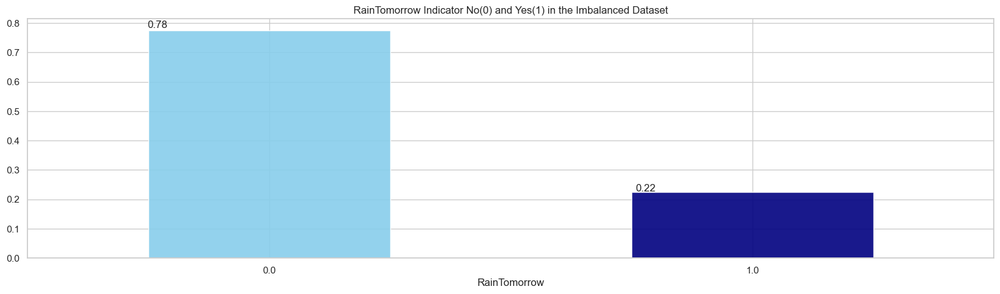

In [97]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (20,5))
ax=full_data.RainTomorrow.value_counts(normalize = True).plot(kind='bar', color= ['skyblue','navy'], alpha = 0.9, rot=0)
plt.title('RainTomorrow Indicator No(0) and Yes(1) in the Imbalanced Dataset')
for p in ax.patches:
    ax.annotate(str(round(p.get_height(),2)), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.show()

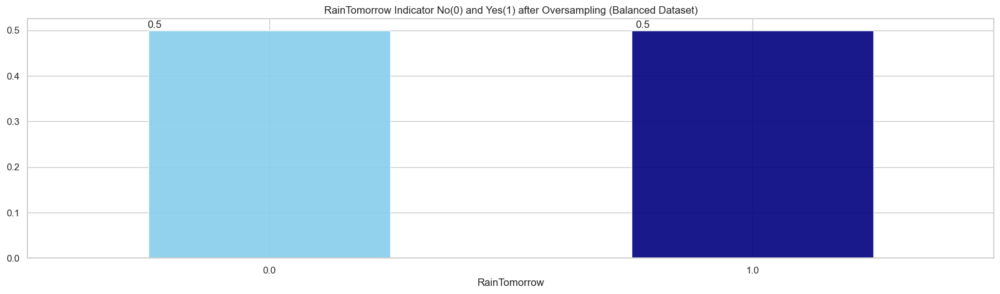

In [98]:
from sklearn.utils import resample

no = full_data[full_data.RainTomorrow == 0]
yes = full_data[full_data.RainTomorrow == 1]
yes_oversampled = resample(yes, replace=True, n_samples=len(no), random_state=42)
oversampled = pd.concat([no, yes_oversampled])

fig = plt.figure(figsize = (20,5))
ax=oversampled.RainTomorrow.value_counts(normalize = True).plot(kind='bar', color= ['skyblue','navy'], alpha = 0.9, rot=0)
plt.title('RainTomorrow Indicator No(0) and Yes(1) after Oversampling (Balanced Dataset)')
for p in ax.patches:
    ax.annotate(str(round(p.get_height(),2)), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.show()

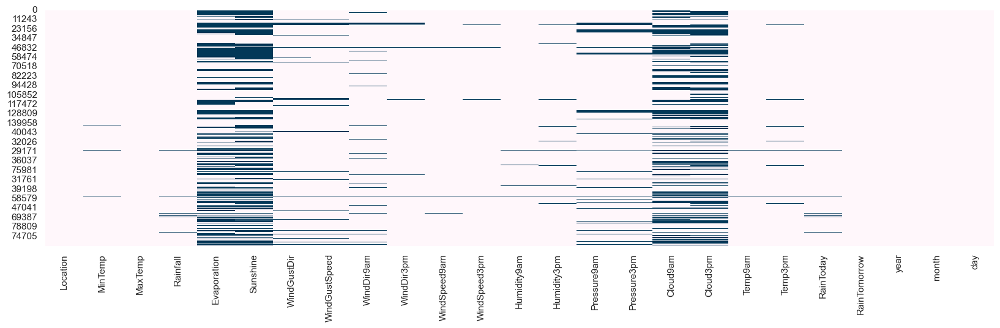

In [99]:
# Missing Data Pattern in Training Data
import seaborn as sns
plt.figure(figsize = (20,5))
sns.heatmap(oversampled.isnull(), cbar=False, cmap='PuBu')
plt.show()

In [100]:
total = oversampled.isnull().sum().sort_values(ascending=False)
percent = (oversampled.isnull().sum()/oversampled.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing.head()

,Total,Percent
Sunshine,104711,0.474596
Evaporation,95325,0.432054
Cloud3pm,85658,0.388239
Cloud9am,81388,0.368886
Pressure9am,21620,0.097991


In [101]:
oversampled.select_dtypes(include=['object']).columns

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm'], dtype='object')

In [102]:
# Impute categorical var with Mode
oversampled['Location'] = oversampled['Location'].fillna(oversampled['Location'].mode()[0])
oversampled['WindGustDir'] = oversampled['WindGustDir'].fillna(oversampled['WindGustDir'].mode()[0])
oversampled['WindDir9am'] = oversampled['WindDir9am'].fillna(oversampled['WindDir9am'].mode()[0])
oversampled['WindDir3pm'] = oversampled['WindDir3pm'].fillna(oversampled['WindDir3pm'].mode()[0])

In [103]:
# Convert categorical features to continuous features with Label Encoding
from sklearn.preprocessing import LabelEncoder
lencoders = {}
for col in oversampled.select_dtypes(include=['object']).columns:
    lencoders[col] = LabelEncoder()
    oversampled[col] = lencoders[col].fit_transform(oversampled[col])

In [104]:
import warnings
warnings.filterwarnings("ignore")
# Multiple Imputation by Chained Equations
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
MiceImputed = oversampled.copy(deep=True) 
mice_imputer = IterativeImputer()
MiceImputed.iloc[:, :] = mice_imputer.fit_transform(oversampled)

In [105]:
# Detecting outliers with IQR
Q1 = MiceImputed.quantile(0.25)
Q3 = MiceImputed.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Location         25.000000
MinTemp           9.200000
MaxTemp          10.200000
Rainfall          2.400000
Evaporation       4.117610
Sunshine          5.961704
WindGustDir       9.000000
WindGustSpeed    19.000000
WindDir9am        8.000000
WindDir3pm        8.000000
WindSpeed9am     13.000000
WindSpeed3pm     11.000000
Humidity9am      26.000000
Humidity3pm      30.000000
Pressure9am       8.700000
Pressure3pm       8.863859
Cloud9am          4.000000
Cloud3pm          3.697490
Temp9am           9.300000
Temp3pm           9.800000
RainToday         1.000000
RainTomorrow      1.000000
year              5.000000
month             5.000000
day              15.000000
dtype: float64


In [106]:
# Removing outliers from the dataset
MiceImputed = MiceImputed[~((MiceImputed < (Q1 - 1.5 * IQR)) |(MiceImputed > (Q3 + 1.5 * IQR))).any(axis=1)]
MiceImputed.shape

(170401, 25)

In [107]:
MiceImputed.tail(5)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
90843,14,15.3,22.1,0.4,4.773765,4.498654,10,48.000000,10,10,...,1028.200000,5.441771,6.692749,18.9,17.8,0.0,1.0,2010,7,27
120324,32,7.1,20.0,6.0,1.800000,8.500000,6,41.000000,5,6,...,1015.400000,2.000000,3.000000,11.1,18.8,1.0,1.0,2016,8,16
16816,24,13.6,32.0,0.0,6.286569,7.235859,13,28.316295,4,4,...,1010.845304,4.000000,6.000000,20.2,31.5,0.0,1.0,2013,12,4
23840,27,12.8,18.6,0.0,6.407614,6.216829,9,33.000000,9,2,...,1021.700000,6.000000,3.000000,17.0,16.8,0.0,1.0,2016,9,11
108762,1,9.5,21.3,4.4,3.400000,8.600000,13,40.260922,3,3,...,1007.100000,1.000000,4.000000,15.0,21.2,1.0,1.0,2009,6,10


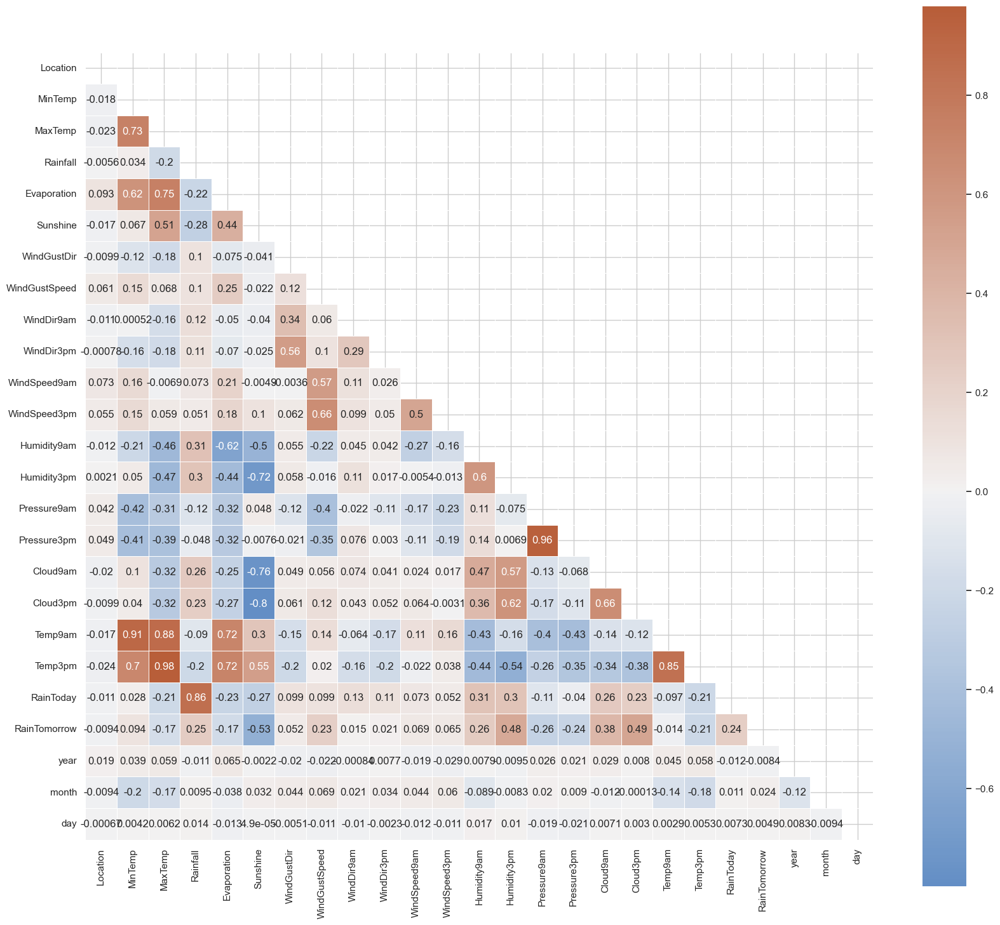

In [108]:
# Correlation Heatmap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
corr = MiceImputed.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(20,20))
cmap = sns.diverging_palette(250, 25, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=True, linewidths=.5, cbar_kws={"shrink": .9})
plt.show()

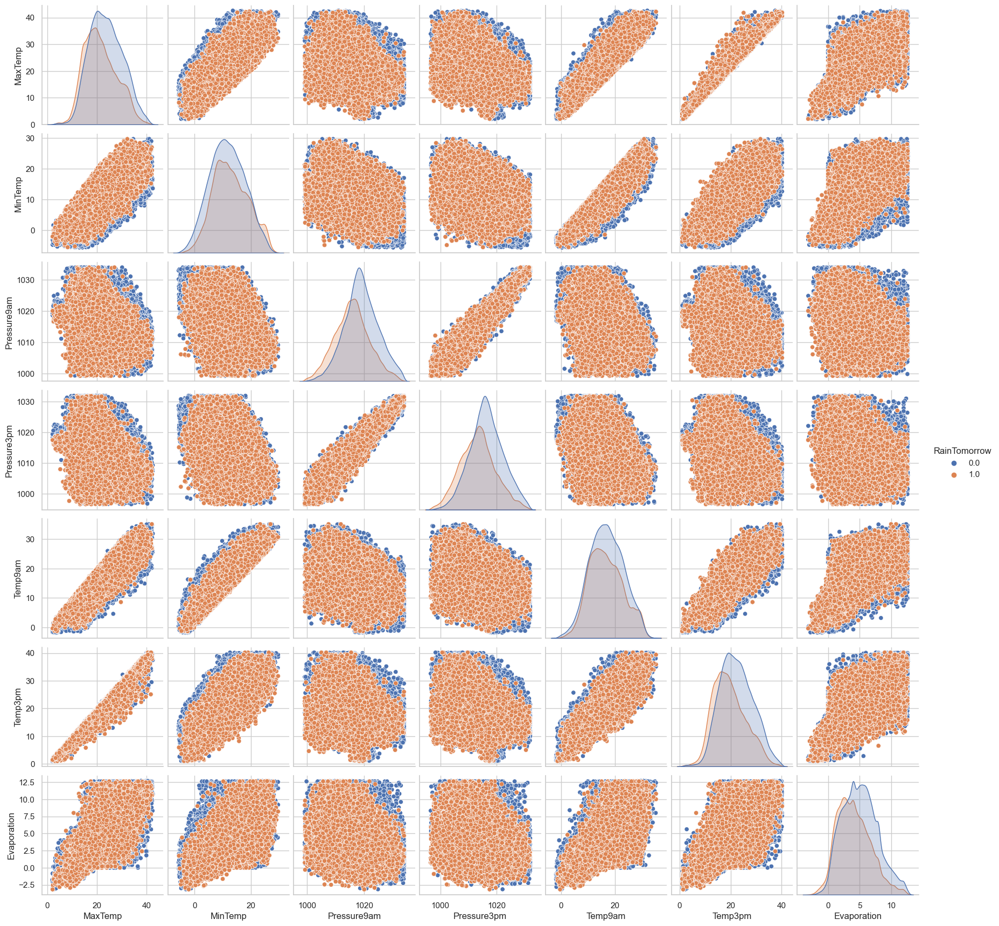

In [134]:
sns.pairplot( data=MiceImputed, vars=('MaxTemp','MinTemp','Pressure9am','Pressure3pm','Temp9am', 'Temp3pm', 'Evaporation'), hue='RainTomorrow' )
plt.show()

# sns.pairplot( data=MiceImputed, vars=(), hue='RainTomorrow' )
# plt.show()

In [137]:
# Assuming you already have 'year', 'month', and 'day' columns in your DataFrame MiceImputed

# Function to encode datetime into cyclic parameters.
def encode(data, col, max_val):
    data[col + '_sin'] = np.sin(2 * np.pi * data[col] / max_val)
    data[col + '_cos'] = np.cos(2 * np.pi * data[col] / max_val)
    return data

# Encoding 'month' column
MiceImputed['month_sin'] = np.sin(2 * np.pi * MiceImputed['month'] / 12)
MiceImputed['month_cos'] = np.cos(2 * np.pi * MiceImputed['month'] / 12)

# Encoding 'day' column
MiceImputed['day_sin'] = np.sin(2 * np.pi * MiceImputed['day'] / 31)
MiceImputed['day_cos'] = np.cos(2 * np.pi * MiceImputed['day'] / 31)

MiceImputed.head()


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Temp3pm,RainToday,RainTomorrow,year,month,day,month_sin,month_cos,day_sin,day_cos
0,2,13.4,22.9,0.6,6.072801,7.661663,13,44.0,13,14,...,21.8,0.0,0.0,2008,12,1,-2.449294e-16,1.0,0.201299,0.979530
1,2,7.4,25.1,0.0,5.970257,11.646092,14,44.0,6,15,...,24.3,0.0,0.0,2008,12,2,-2.449294e-16,1.0,0.394356,0.918958
2,2,12.9,25.7,0.0,8.061939,12.455989,15,46.0,13,15,...,23.2,0.0,0.0,2008,12,3,-2.449294e-16,1.0,0.571268,0.820763
3,2,9.2,28.0,0.0,6.289679,11.937781,4,24.0,9,0,...,26.5,0.0,0.0,2008,12,4,-2.449294e-16,1.0,0.724793,0.688967
4,2,17.5,32.3,1.0,7.392235,6.140667,13,41.0,1,7,...,29.7,0.0,0.0,2008,12,5,-2.449294e-16,1.0,0.848644,0.528964


In [138]:
# Standardizing data
from sklearn import preprocessing
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(MiceImputed)
modified_data = pd.DataFrame(r_scaler.transform(MiceImputed), index=MiceImputed.index, columns=MiceImputed.columns)

In [139]:
# Feature Importance using Filter Method (Chi-Square)
from sklearn.feature_selection import SelectKBest, chi2
X = modified_data.loc[:,modified_data.columns!='RainTomorrow']
y = modified_data[['RainTomorrow']]
selector = SelectKBest(chi2, k=10)
selector.fit(X, y)
X_new = selector.transform(X)
print(X.columns[selector.get_support(indices=True)])

Index(['Rainfall', 'Sunshine', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'RainToday'],
      dtype='object')


In [113]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier as rf

X = MiceImputed.drop('RainTomorrow', axis=1)
y = MiceImputed['RainTomorrow']
selector = SelectFromModel(rf(n_estimators=100, random_state=0))
selector.fit(X, y)
support = selector.get_support()
features = X.loc[:,support].columns.tolist()
print(features)
print(rf(n_estimators=100, random_state=0).fit(X,y).feature_importances_)

['Sunshine', 'WindGustSpeed', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm']
[0.02718117 0.03214722 0.0319639  0.02801273 0.03223452 0.11267362
 0.01998611 0.0419042  0.02064722 0.0210322  0.02106017 0.02272426
 0.03112416 0.11860736 0.0472595  0.05856998 0.05659081 0.13926782
 0.03094184 0.03333469 0.0133717  0.01727235 0.01858183 0.02351064]


In [133]:
features = MiceImputed[['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 
                       'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 
                       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 
                       'RainToday','day']]
target = MiceImputed['RainTomorrow']

# Split into test and train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42,
                                                    shuffle=True, stratify=target)

# Normalize Features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

In [115]:
def plot_roc_cur(fper, tper):  
    plt.plot(fper, tper, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

In [116]:
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (accuracy_score, roc_auc_score, cohen_kappa_score,
                             confusion_matrix, ConfusionMatrixDisplay, 
                             roc_curve, classification_report)

def plot_roc_cur(fper, tper):
    plt.plot(fper, tper, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

def run_model(model, X_train, y_train, X_test, y_test, verbose=True):
    t0 = time.time()
    
    if not verbose:
        model.fit(X_train, y_train, verbose=0)
    else:
        model.fit(X_train, y_train)
        
    y_pred = model.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)
    coh_kap = cohen_kappa_score(y_test, y_pred)
    
    time_taken = time.time() - t0
    
    print(f"Accuracy = {accuracy}")
    print(f"ROC Area under Curve = {roc_auc}")
    print(f"Cohen's Kappa = {coh_kap}")
    print(f"Time taken = {time_taken}")
    
    print(classification_report(y_test, y_pred, digits=5))
    
    # Plot ROC curve
    probs = model.predict_proba(X_test)
    probs = probs[:, 1]
    fper, tper, _ = roc_curve(y_test, probs)
    plot_roc_cur(fper, tper)
    
    # Compute and plot normalized confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    ConfusionMatrixDisplay(cm_normalized, display_labels=model.classes_).plot(cmap=plt.cm.Blues)
    
    return model, accuracy, roc_auc, coh_kap, time_taken


Accuracy = 0.7951351192746692
ROC Area under Curve = 0.7891012325910688
Cohen's Kappa = 0.5816187982868368
Time taken = 1.4227383136749268
              precision    recall  f1-score   support

         0.0    0.80455   0.83855   0.82119     19120
         1.0    0.78188   0.73966   0.76018     14961

    accuracy                        0.79514     34081
   macro avg    0.79322   0.78910   0.79069     34081
weighted avg    0.79460   0.79514   0.79441     34081



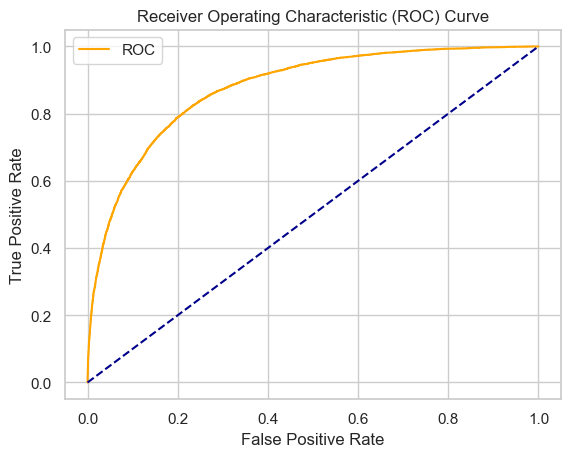

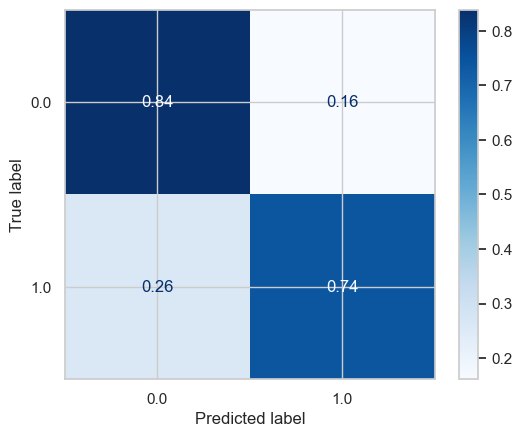

In [117]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression

params_lr = {'penalty': 'l1', 'solver':'liblinear'}

model_lr = LogisticRegression(**params_lr)
model_lr, accuracy_lr, roc_auc_lr, coh_kap_lr, tt_lr = run_model(model_lr, X_train, y_train, X_test, y_test)

Accuracy = 0.8693700302221179
ROC Area under Curve = 0.8713208631143903
Cohen's Kappa = 0.7368565430656339
Time taken = 0.45801496505737305
              precision    recall  f1-score   support

         0.0    0.90654   0.85533   0.88019     19120
         1.0    0.82757   0.88731   0.85640     14961

    accuracy                        0.86937     34081
   macro avg    0.86705   0.87132   0.86830     34081
weighted avg    0.87187   0.86937   0.86975     34081



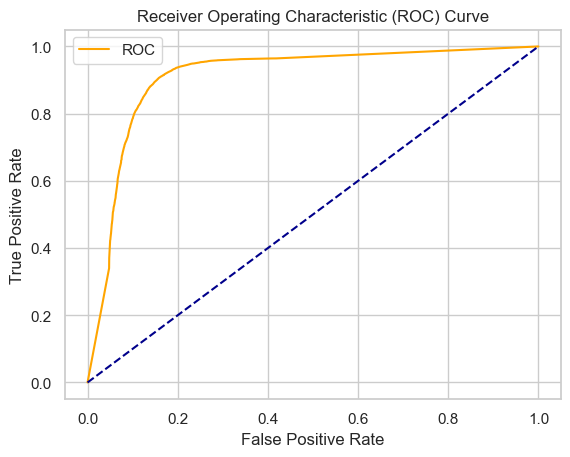

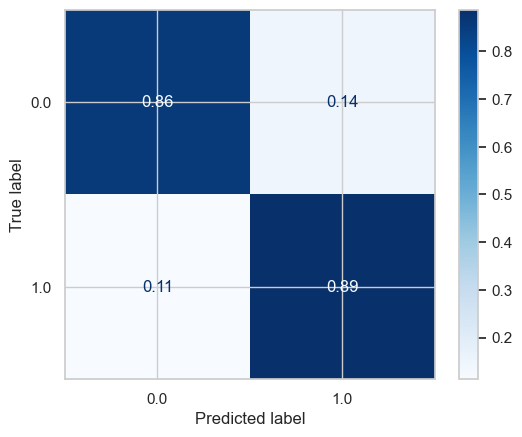

In [118]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier

params_dt = {'max_depth': 16,
             'max_features': "sqrt"}

model_dt = DecisionTreeClassifier(**params_dt)
model_dt, accuracy_dt, roc_auc_dt, coh_kap_dt, tt_dt = run_model(model_dt, X_train, y_train, X_test, y_test)



Accuracy = 0.8853026613068865
ROC Area under Curve = 0.8842848221974065
Cohen's Kappa = 0.7674705414928403
Time taken = 299.9664194583893
              precision    recall  f1-score   support

         0.0    0.90192   0.89263   0.89725     19120
         1.0    0.86456   0.87594   0.87021     14961

    accuracy                        0.88530     34081
   macro avg    0.88324   0.88428   0.88373     34081
weighted avg    0.88552   0.88530   0.88538     34081



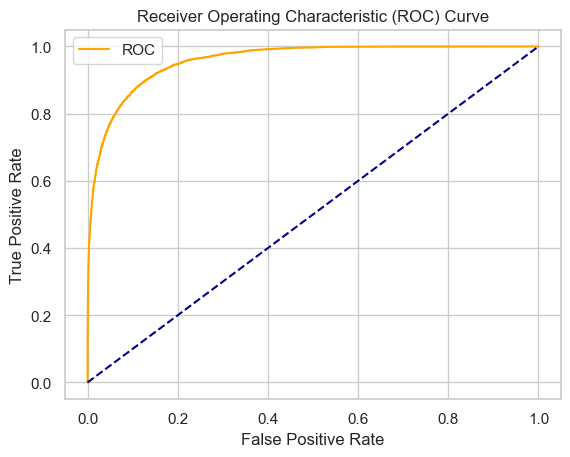

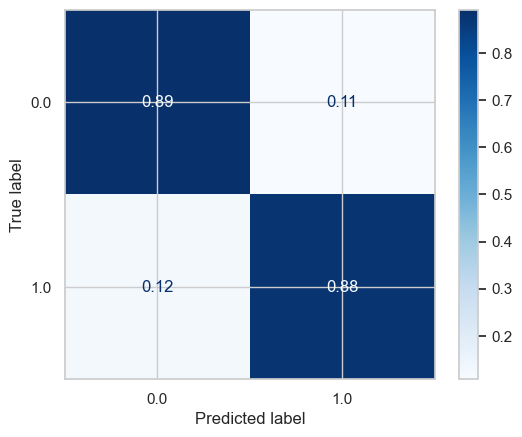

In [119]:
# Neural Network
from sklearn.neural_network import MLPClassifier

params_nn = {'hidden_layer_sizes': (30,30,30),
             'activation': 'logistic',
             'solver': 'lbfgs',
             'max_iter': 500}

model_nn = MLPClassifier(**params_nn)
model_nn, accuracy_nn, roc_auc_nn, coh_kap_nn, tt_nn = run_model(model_nn, X_train, y_train, X_test, y_test)

Accuracy = 0.9290807194624571
ROC Area under Curve = 0.9304475737335482
Cohen's Kappa = 0.8567161712585682
Time taken = 36.689191579818726
              precision    recall  f1-score   support

         0.0    0.95268   0.91925   0.93567     19120
         1.0    0.90123   0.94165   0.92099     14961

    accuracy                        0.92908     34081
   macro avg    0.92695   0.93045   0.92833     34081
weighted avg    0.93009   0.92908   0.92923     34081



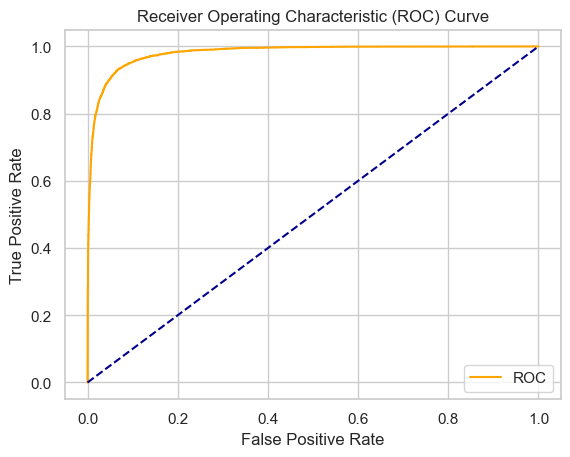

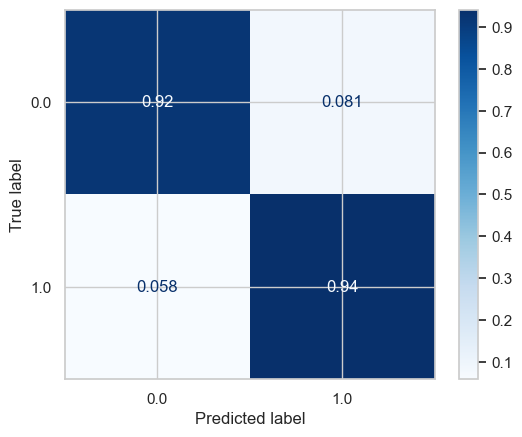

In [120]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier

params_rf = {'max_depth': 16,
             'min_samples_leaf': 1,
             'min_samples_split': 2,
             'n_estimators': 100,
             'random_state': 42}

model_rf = RandomForestClassifier(**params_rf)
model_rf, accuracy_rf, roc_auc_rf, coh_kap_rf, tt_rf = run_model(model_rf, X_train, y_train, X_test, y_test)

Accuracy = 0.8743288049059593
ROC Area under Curve = 0.8750933249321318
Cohen's Kappa = 0.7462103816152088
Time taken = 1.200256586074829
              precision    recall  f1-score   support

         0.0    0.90346   0.86883   0.88581     19120
         1.0    0.84019   0.88136   0.86028     14961

    accuracy                        0.87433     34081
   macro avg    0.87183   0.87509   0.87305     34081
weighted avg    0.87569   0.87433   0.87460     34081



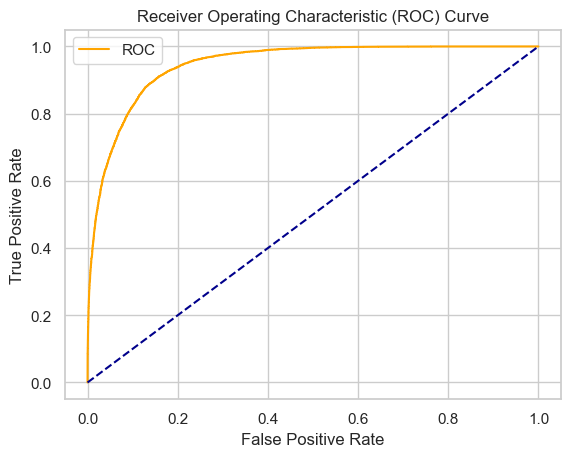

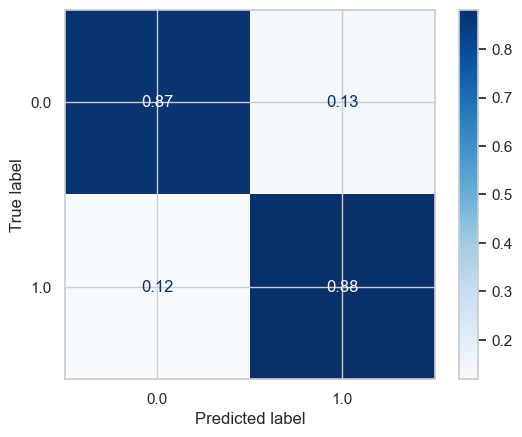

In [121]:
# Light GBM
import lightgbm as lgb
params_lgb ={'colsample_bytree': 0.95, 
         'max_depth': 16, 
         'min_split_gain': 0.1, 
         'n_estimators': 200, 
         'num_leaves': 50, 
         'reg_alpha': 1.2, 
         'reg_lambda': 1.2, 
         'subsample': 0.95, 
         'subsample_freq': 20}

model_lgb = lgb.LGBMClassifier(**params_lgb)
model_lgb, accuracy_lgb, roc_auc_lgb, coh_kap_lgb, tt_lgb = run_model(model_lgb, X_train, y_train, X_test, y_test)


Accuracy = 0.9434288899973592
ROC Area under Curve = 0.9468191426020065
Cohen's Kappa = 0.8861143847085211
Time taken = 226.5892689228058
              precision    recall  f1-score   support

         0.0    0.97883   0.91904   0.94799     19120
         1.0    0.90402   0.97460   0.93799     14961

    accuracy                        0.94343     34081
   macro avg    0.94143   0.94682   0.94299     34081
weighted avg    0.94599   0.94343   0.94360     34081



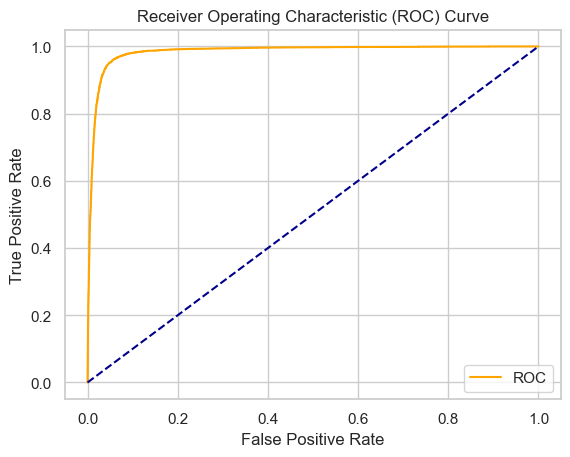

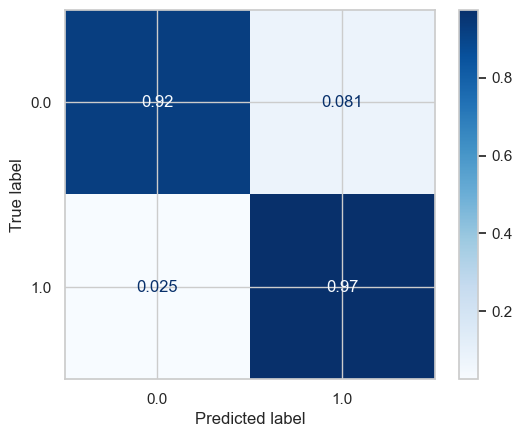

In [122]:
# Catboost
import catboost as cb
params_cb ={'iterations': 50,
            'max_depth': 16}

model_cb = cb.CatBoostClassifier(**params_cb)
model_cb, accuracy_cb, roc_auc_cb, coh_kap_cb, tt_cb = run_model(model_cb, X_train, y_train, X_test, y_test, verbose=False)


Accuracy = 0.957601009360054
ROC Area under Curve = 0.959856993245199
Cohen's Kappa = 0.9144159793178227
Time taken = 42.774718284606934
              precision    recall  f1-score   support

         0.0    0.98232   0.94137   0.96141     19120
         1.0    0.92886   0.97834   0.95296     14961

    accuracy                        0.95760     34081
   macro avg    0.95559   0.95986   0.95718     34081
weighted avg    0.95885   0.95760   0.95770     34081



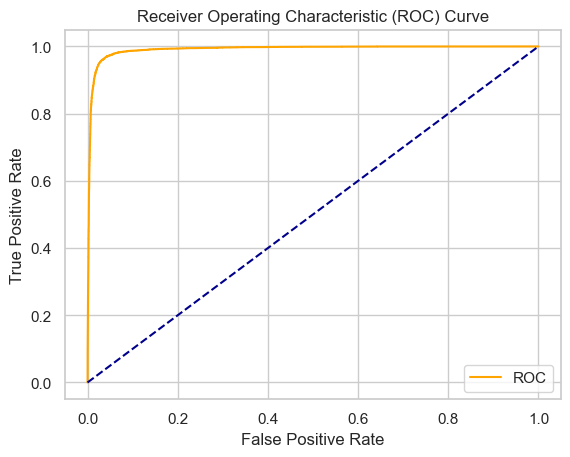

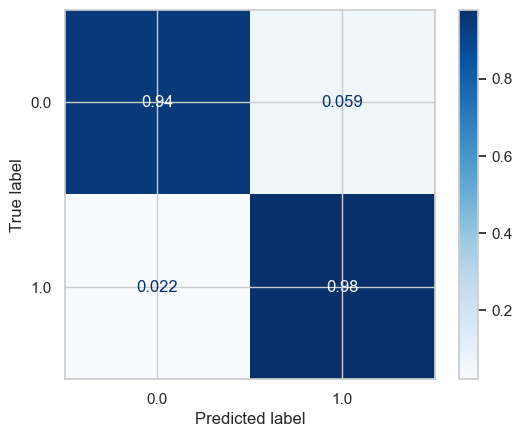

In [123]:
# XGBoost
import xgboost as xgb
params_xgb ={'n_estimators': 500,
            'max_depth': 16}

model_xgb = xgb.XGBClassifier(**params_xgb)
model_xgb, accuracy_xgb, roc_auc_xgb, coh_kap_xgb, tt_xgb = run_model(model_xgb, X_train, y_train, X_test, y_test)


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000802 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.


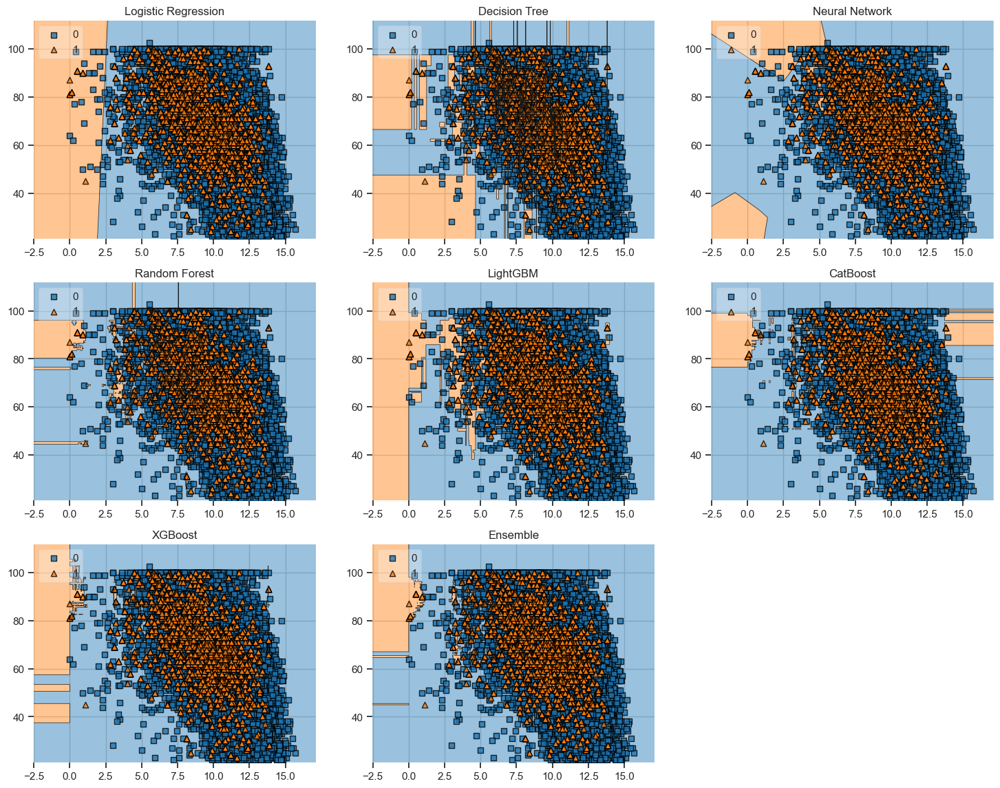

In [124]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import itertools
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb
import catboost as cb
import xgboost as xgb
from mlxtend.classifier import EnsembleVoteClassifier
from mlxtend.plotting import plot_decision_regions

value = 1.80
width = 0.90

clf1 = LogisticRegression(random_state=42)
clf2 = DecisionTreeClassifier(random_state=42) 
clf3 = MLPClassifier(random_state=42, verbose = 0)
clf4 = RandomForestClassifier(random_state=42)
clf5 = lgb.LGBMClassifier(random_state=42, verbose = 0)
clf6 = cb.CatBoostClassifier(random_state=42, verbose = 0)
clf7 = xgb.XGBClassifier(random_state=42)
eclf = EnsembleVoteClassifier(clfs=[clf4, clf5, clf6, clf7], weights=[1, 1, 1, 1], voting='soft')

X_list = MiceImputed[["Sunshine", "Humidity9am", "Cloud3pm"]] #took only really important features
X = np.asarray(X_list, dtype=np.float32)
y_list = MiceImputed["RainTomorrow"]
y = np.asarray(y_list, dtype=np.int32)

# Plotting Decision Regions
gs = gridspec.GridSpec(3,3)
fig = plt.figure(figsize=(18, 14))

labels = ['Logistic Regression',
          'Decision Tree',
          'Neural Network',
          'Random Forest',
          'LightGBM',
          'CatBoost',
          'XGBoost',
          'Ensemble']

for clf, lab, grd in zip([clf1, clf2, clf3, clf4, clf5, clf6, clf7, eclf],
                         labels,
                         itertools.product([0, 1, 2],
                         repeat=2)):
    clf.fit(X, y)
    ax = plt.subplot(gs[grd[0], grd[1]])
    fig = plot_decision_regions(X=X, y=y, clf=clf, 
                                filler_feature_values={2: value}, 
                                filler_feature_ranges={2: width}, 
                                legend=2)
    plt.title(lab)

plt.show()

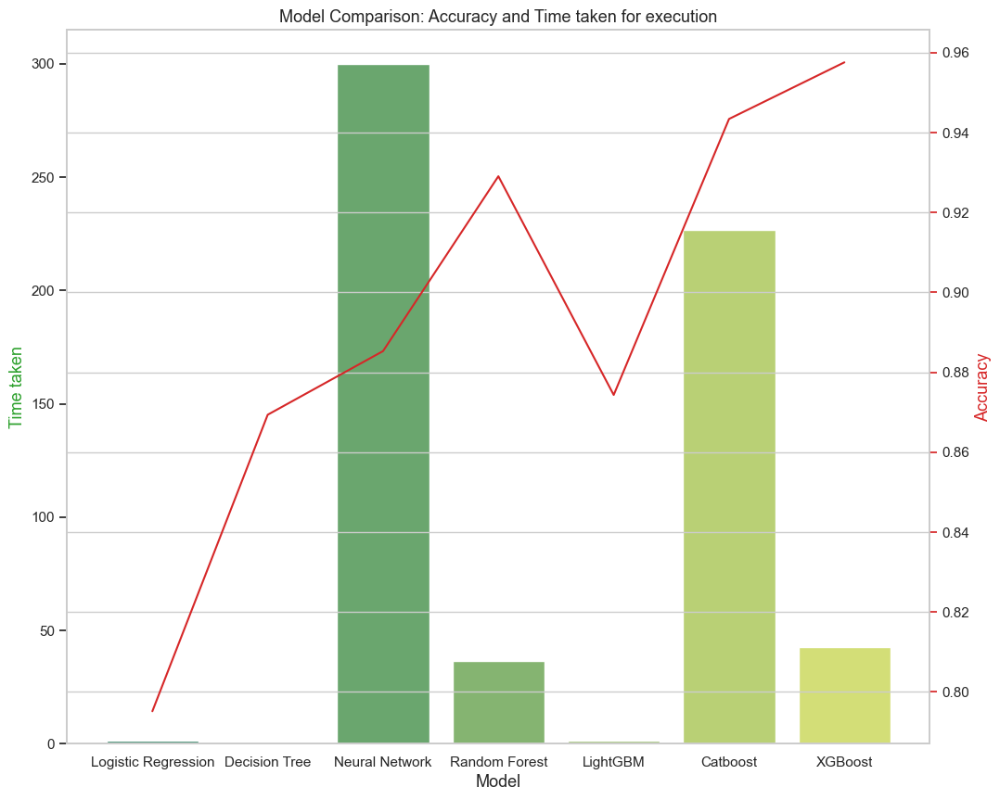

In [125]:
accuracy_scores = [accuracy_lr, accuracy_dt, accuracy_nn, accuracy_rf, accuracy_lgb, accuracy_cb, accuracy_xgb]
roc_auc_scores = [roc_auc_lr, roc_auc_dt, roc_auc_nn, roc_auc_rf, roc_auc_lgb, roc_auc_cb, roc_auc_xgb]
coh_kap_scores = [coh_kap_lr, coh_kap_dt, coh_kap_nn, coh_kap_rf, coh_kap_lgb, coh_kap_cb, coh_kap_xgb]
tt = [tt_lr, tt_dt, tt_nn, tt_rf, tt_lgb, tt_cb, tt_xgb]

model_data = {'Model': ['Logistic Regression','Decision Tree','Neural Network','Random Forest','LightGBM','Catboost','XGBoost'],
              'Accuracy': accuracy_scores,
              'ROC_AUC': roc_auc_scores,
              'Cohen_Kappa': coh_kap_scores,
              'Time taken': tt}
data = pd.DataFrame(model_data)

fig, ax1 = plt.subplots(figsize=(12,10))
ax1.set_title('Model Comparison: Accuracy and Time taken for execution', fontsize=13)
color = 'tab:green'
ax1.grid()
ax1.set_xlabel('Model', fontsize=13)
ax1.set_ylabel('Time taken', fontsize=13, color=color)
ax2 = sns.barplot(x='Model', y='Time taken', data = data, palette='summer')
ax1.tick_params(axis='y')
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Accuracy', fontsize=13, color=color)
ax2 = sns.lineplot(x='Model', y='Accuracy', data = data, sort=False, color=color)
ax2.tick_params(axis='y', color=color)

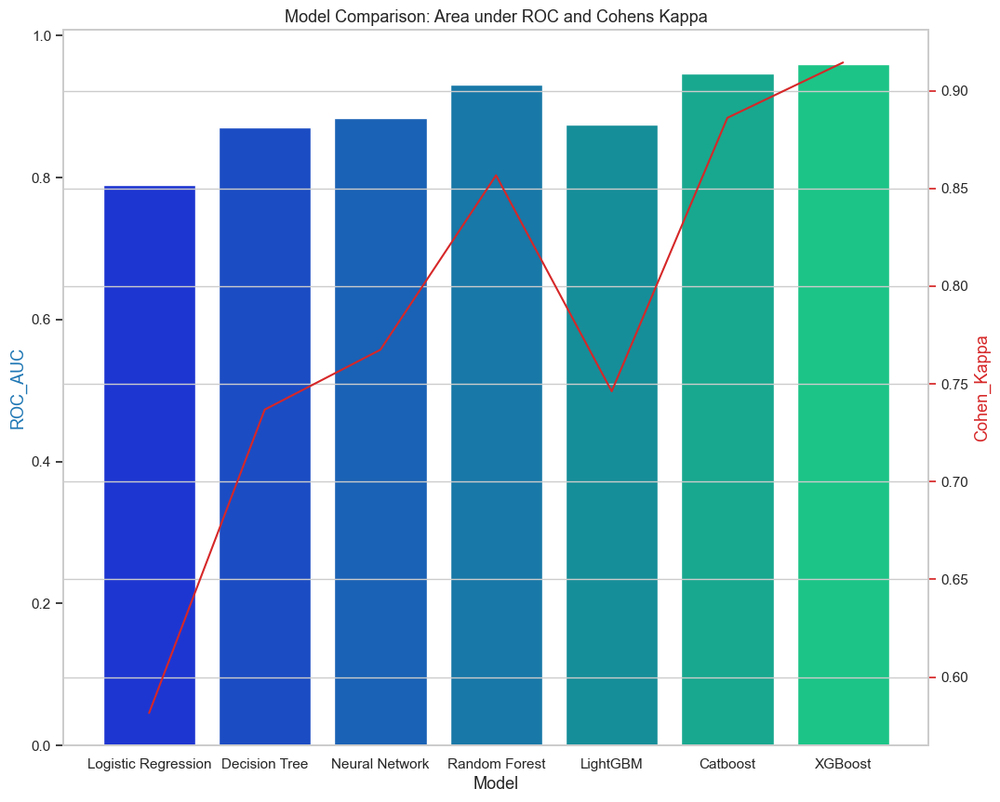

In [126]:
fig, ax3 = plt.subplots(figsize=(12,10))
ax3.set_title('Model Comparison: Area under ROC and Cohens Kappa', fontsize=13)
color = 'tab:blue'
ax3.grid()
ax3.set_xlabel('Model', fontsize=13)
ax3.set_ylabel('ROC_AUC', fontsize=13, color=color)
ax4 = sns.barplot(x='Model', y='ROC_AUC', data = data, palette='winter')
ax3.tick_params(axis='y')
ax4 = ax3.twinx()
color = 'tab:red'
ax4.set_ylabel('Cohen_Kappa', fontsize=13, color=color)
ax4 = sns.lineplot(x='Model', y='Cohen_Kappa', data = data, sort=False, color=color)
ax4.tick_params(axis='y', color=color)
plt.show()

In [127]:
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score
import xgboost as xgb
import catboost as cb
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier

# Initialize your previously trained models with their parameters
params_xgb = {'n_estimators': 500, 'max_depth': 16}
model_xgb = xgb.XGBClassifier(**params_xgb)

params_cb = {'iterations': 50, 'max_depth': 16}
model_cb = cb.CatBoostClassifier(**params_cb)

params_nn = {'hidden_layer_sizes': (30,30,30), 'activation': 'logistic', 'solver': 'lbfgs', 'max_iter': 500}
model_nn = MLPClassifier(**params_nn)

params_rf = {'max_depth': 16, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': 42}
model_rf = RandomForestClassifier(**params_rf)

# Fit each model on the training data
model_xgb.fit(X_train, y_train)
model_cb.fit(X_train, y_train)
model_nn.fit(X_train, y_train)
model_rf.fit(X_train, y_train)

# Create an ensemble of the models using soft voting
ensemble_model = VotingClassifier(estimators=[
        ('xgb', model_xgb),
        ('cb', model_cb),
        ('nn', model_nn),
        ('rf', model_rf)],
        voting='soft')

# Fit ensemble model on training data
ensemble_model.fit(X_train, y_train)

# Evaluate ensemble model on test data
y_pred_ensemble = ensemble_model.predict(X_test)
ensemble_accuracy = accuracy_score(y_test, y_pred_ensemble)
ensemble_roc_auc = roc_auc_score(y_test, y_pred_ensemble)
ensemble_coh_kap = cohen_kappa_score(y_test, y_pred_ensemble)

print(f"Ensemble Model Accuracy: {ensemble_accuracy}")
print(f"Ensemble Model ROC AUC: {ensemble_roc_auc}")
print(f"Ensemble Model Cohen's Kappa: {ensemble_coh_kap}")

# You can now compare these metrics with those of the individual models to evaluate the performance


Learning rate set to 0.5
0:	learn: 0.4542090	total: 4.12s	remaining: 3m 21s
1:	learn: 0.3656915	total: 8.14s	remaining: 3m 15s
2:	learn: 0.3330681	total: 12.4s	remaining: 3m 14s
3:	learn: 0.3031359	total: 16.6s	remaining: 3m 11s
4:	learn: 0.2684808	total: 20.9s	remaining: 3m 7s
5:	learn: 0.2518366	total: 24.8s	remaining: 3m 2s
6:	learn: 0.2221275	total: 29.1s	remaining: 2m 58s
7:	learn: 0.2065817	total: 33.2s	remaining: 2m 54s
8:	learn: 0.1878125	total: 37.5s	remaining: 2m 50s
9:	learn: 0.1734286	total: 41.5s	remaining: 2m 46s
10:	learn: 0.1631829	total: 45.9s	remaining: 2m 42s
11:	learn: 0.1496633	total: 49.9s	remaining: 2m 37s
12:	learn: 0.1385222	total: 53.9s	remaining: 2m 33s
13:	learn: 0.1236810	total: 58.1s	remaining: 2m 29s
14:	learn: 0.1175578	total: 1m 2s	remaining: 2m 25s
15:	learn: 0.1093737	total: 1m 6s	remaining: 2m 20s
16:	learn: 0.1026605	total: 1m 10s	remaining: 2m 17s
17:	learn: 0.0955328	total: 1m 15s	remaining: 2m 13s
18:	learn: 0.0872576	total: 1m 19s	remaining: 2m 

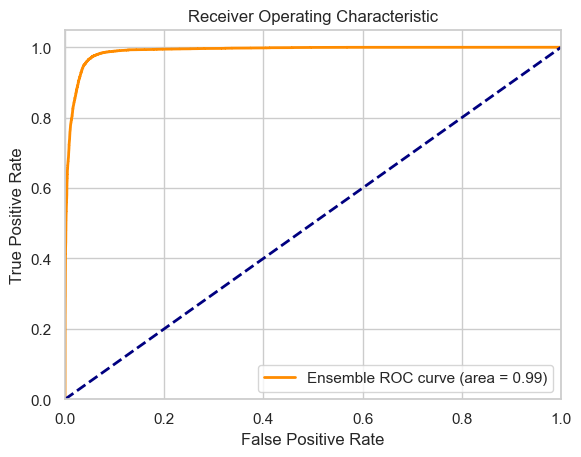

In [128]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Evaluate ensemble model on test data to get predicted probabilities
y_pred_probs_ensemble = ensemble_model.predict_proba(X_test)[:, 1]  # probabilities for the positive outcome

# Compute ROC curve and ROC area for the ensemble model
fpr_ensemble, tpr_ensemble, _ = roc_curve(y_test, y_pred_probs_ensemble)
roc_auc_ensemble = auc(fpr_ensemble, tpr_ensemble)

# Plot ROC curve
plt.figure()
lw = 2  # line width
plt.plot(fpr_ensemble, tpr_ensemble, color='darkorange',
         lw=lw, label=f'Ensemble ROC curve (area = {roc_auc_ensemble:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


In [130]:
ensemble_model

VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            gpu_id=None, grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_ra...
                                            monotone_constraints=None,
                                            n_estimators=500, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=None, ...)),
                             ('cb',
                              <catboost.core.CatBoostClassifier object at 0x00000295AB986040>),
                             ('nn',
                              MLPClassifier(activation='logistic',
                                            hidden_layer_sizes=(30, 30, 30),
                                            max_iter=500, solver='lbfgs')),
                             ('rf',
                              RandomForestClassifier(max_depth=16,
                                                     random_state=42))],
                 voting='soft')

In [131]:
accuracy_ensemble = accuracy_score(y_test, y_pred_ensemble)
print(f"Ensemble model accuracy: {accuracy_ensemble:.2f}")

Ensemble model accuracy: 0.96
